<center>Age and Gender Prediction</center>


The <a href="https://susanqq.github.io/UTKFace/"> UTKFace dataset </a> is a large-scale faces dataset consisting of over 20,000 images. The images cover a wide range of ages and races and include both males and females. 

Using this dataset, I will be attempting to create a model capable of predicting the age and gender of an individual.

#Concepts to explore

- Classification task
- Convolutional neural network
- AI ethics and bias
- Model interpretability

#Requirements

- Going through the standard cycle of EDA-model-evaluation.
- Create a single model that returns age and gender in a single pass
- Analyze model performance
- Understand, which are the best/worst performing samples.
- Use LIME for model interpretability with images. Understand what you model

Once done with these tasks, I will also evaluate any ethical issues with this model

- Identify how this model can be biased and check if the results show signs of these issues.
- Analyze bad predictions. Are there any patterns in misclassified samples, that can cause ethical concerns?
- Describe in which scenarios the model can be biased. Propose solutions to mitigate it.
- Think of a domain, where this model could/could-not be deployed.

In [1]:
import os
import random
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import seaborn as sns

BASE_DIR = r'data/utkface_aligned_cropped/UTKFace'

In [2]:
def is_grayscale(image):
    return np.array_equal(image[:,:,0], image[:,:,1]) and np.array_equal(image[:,:,1], image[:,:,2])

age_labels = []
gender_labels = []
image_paths = []
ethnicity_labels = []

image_filenames = os.listdir(BASE_DIR)
random.shuffle(image_filenames)

corrupt_files = []
non_rgb_files = []
unique_shapes = set()
grayscale_images = []
non_jpg_files = []

for image in tqdm(image_filenames):
    if len(image.split('_')) != 4:
        print(f"Skipping file with unexpected format: {image}")
        continue

    if not image.lower().endswith('.jpg'):
        print(f"Skipping file with non-.jpg extension: {image}")
        non_jpg_files.append(image)
        continue
    
    image_path = os.path.join(BASE_DIR, image)
    img_components = image.split('_')
    try:
        age_label = int(img_components[0])
        gender_label = int(img_components[1])
        ethnicity_label = int(img_components[2])
    except ValueError:
        print(f"Skipping file with invalid labels: {image}")
        continue

    img = cv2.imread(image_path)
    if img is None:
        print(f"Skipping unreadable/corrupt file: {image_path}")
        corrupt_files.append(image_path)
        continue

    if len(img.shape) != 3 or img.shape[2] != 3:
        print(f"Skipping non-RGB image: {image_path}")
        non_rgb_files.append(image_path)
        continue
    
    if is_grayscale(img):
        print(f"Skipping grayscale image: {image_path}")
        grayscale_images.append(image_path)
        continue

    unique_shapes.add(img.shape)

    age_labels.append(age_label)
    gender_labels.append(gender_label)
    ethnicity_labels.append(ethnicity_label)
    image_paths.append(image_path)

age_labels = np.array(age_labels)
gender_labels = np.array(gender_labels)
ethnicity_labels = np.array(ethnicity_labels)
image_paths = np.array(image_paths)

  0%|          | 54/23708 [00:00<02:15, 174.74it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_0_20170116201342325.jpg.chip.jpg


  0%|          | 92/23708 [00:00<02:09, 182.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/60_1_0_20170117174613438.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_1_20170116215621993.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_0_20170117185722081.jpg.chip.jpg


  1%|          | 148/23708 [00:00<02:16, 172.67it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170117202555320.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_0_1_20170113142324284.jpg.chip.jpg


  1%|          | 237/23708 [00:01<02:22, 164.29it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170116222824108.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_1_0_20170109214608184.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170116234619701.jpg.chip.jpg


  1%|▏         | 326/23708 [00:01<02:34, 151.29it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/67_0_1_20170117190207133.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_4_20170117201650134.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_3_20170119195829723.jpg.chip.jpg


  2%|▏         | 428/23708 [00:02<02:28, 156.71it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/82_0_0_20170111210233971.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_1_20170113184825438.jpg.chip.jpg


  2%|▏         | 526/23708 [00:03<02:04, 185.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_0_20170116201420399.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_1_20170117013657018.jpg.chip.jpg


  3%|▎         | 666/23708 [00:03<02:05, 182.88it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_1_20170117204703255.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/43_1_0_20170117155104591.jpg.chip.jpg


  3%|▎         | 704/23708 [00:04<02:10, 175.93it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/63_0_0_20170117195107740.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170113174401250.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170117194942245.jpg.chip.jpg


  3%|▎         | 742/23708 [00:04<02:07, 179.46it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_3_20170119180508068.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_1_20170116205636712.jpg.chip.jpg


  3%|▎         | 820/23708 [00:04<02:12, 172.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_3_20170119210122240.jpg.chip.jpg


  4%|▎         | 861/23708 [00:04<02:02, 186.90it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/46_0_2_20170116224908862.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170117144930395.jpg.chip.jpg


  4%|▍         | 995/23708 [00:05<02:04, 183.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_1_20170117020448529.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_2_20170116180519798.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117140418545.jpg.chip.jpg


  4%|▍         | 1052/23708 [00:06<02:07, 177.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170116220238281.jpg.chip.jpg


  5%|▍         | 1089/23708 [00:06<02:09, 174.73it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117193539276.jpg.chip.jpg


  5%|▍         | 1125/23708 [00:06<02:16, 165.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/60_0_0_20170117091256462.jpg.chip.jpg


  5%|▍         | 1181/23708 [00:06<02:15, 166.61it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170113001614997.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_0_0_20170117193153029.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_4_20170117202422103.jpg.chip.jpg


  5%|▌         | 1298/23708 [00:07<01:58, 189.66it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117171702618.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170105183611646.jpg.chip.jpg


  6%|▌         | 1396/23708 [00:08<02:14, 165.38it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_0_0_20170117154743159.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_1_0_20170104184036733.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170116211903141.jpg.chip.jpg


  6%|▌         | 1433/23708 [00:08<02:11, 168.76it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/52_0_3_20170119205733615.jpg.chip.jpg


  6%|▌         | 1470/23708 [00:08<02:09, 172.00it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_0_20170117122016549.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/75_0_0_20170111210552235.jpg.chip.jpg


  7%|▋         | 1566/23708 [00:09<02:08, 171.94it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117131118803.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117142917573.jpg.chip.jpg


  7%|▋         | 1642/23708 [00:09<02:07, 173.28it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117201135295.jpg.chip.jpg


  7%|▋         | 1778/23708 [00:10<01:54, 191.94it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_0_1_20170113133303935.jpg.chip.jpg


  8%|▊         | 1838/23708 [00:10<01:59, 183.48it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_1_20170113132355967.jpg.chip.jpg


  8%|▊         | 1879/23708 [00:10<01:54, 191.15it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170109133037167.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_1_0_20170117135907876.jpg.chip.jpg


  8%|▊         | 1918/23708 [00:10<01:58, 184.60it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_1_0_20170110153005989.jpg.chip.jpg


  9%|▊         | 2038/23708 [00:11<01:54, 190.07it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/63_0_1_20170117194942794.jpg.chip.jpg


  9%|▉         | 2103/23708 [00:11<01:50, 195.96it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_3_20170119205336640.jpg.chip.jpg


  9%|▉         | 2143/23708 [00:12<01:51, 194.04it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_3_20170119201733085.jpg.chip.jpg


  9%|▉         | 2223/23708 [00:12<02:00, 178.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_0_1_20170113184519863.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/73_0_1_20170117195312638.jpg.chip.jpg


 10%|▉         | 2279/23708 [00:12<02:04, 171.89it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_1_0_20170116222807886.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_1_0_20170116201120465.jpg.chip.jpg


 10%|▉         | 2343/23708 [00:13<01:48, 196.14it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/44_0_0_20170120220042234.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/63_0_1_20170117194927661.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_0_0_20170116205530259.jpg.chip.jpg


 10%|█         | 2383/23708 [00:13<01:51, 190.50it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/9_0_0_20170110224425000.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_1_20170117183551382.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/55_0_0_20170117191559491.jpg.chip.jpg


 10%|█         | 2465/23708 [00:13<01:50, 192.77it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_3_20170117193843284.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117151428835.jpg.chip.jpg


 11%|█         | 2505/23708 [00:14<01:52, 187.67it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170117135559253.jpg.chip.jpg


 11%|█         | 2563/23708 [00:14<01:55, 183.54it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_1_20170113135628651.jpg.chip.jpg


 11%|█         | 2610/23708 [00:14<01:42, 206.47it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/37_1_1_20170117172409586.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/17_0_0_20170116201003399.jpg.chip.jpg


 11%|█▏        | 2674/23708 [00:14<01:43, 202.44it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/3_0_1_20170110213755346.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_1_20170116213517627.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_0_20170117180529832.jpg.chip.jpg


 12%|█▏        | 2757/23708 [00:15<01:50, 189.75it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117181217157.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/39_0_0_20170117185152073.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117154331222.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_1_0_20170117191534338.jpg.chip.jpg


 12%|█▏        | 2817/23708 [00:15<01:54, 182.86it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117091437385.jpg.chip.jpg


 12%|█▏        | 2856/23708 [00:15<01:54, 181.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_1_20170116215513416.jpg.chip.jpg


 12%|█▏        | 2914/23708 [00:16<01:57, 177.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_1_20170117135556256.jpg.chip.jpg


 13%|█▎        | 2993/23708 [00:16<01:52, 183.92it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_0_20170117160515849.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_1_1_20170116234410850.jpg.chip.jpg


 13%|█▎        | 3154/23708 [00:17<01:50, 186.54it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_1_0_20170109142531078.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/73_0_1_20170117195325010.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170116024031179.jpg.chip.jpg


 14%|█▍        | 3317/23708 [00:18<01:46, 191.97it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_1_20170117193633529.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/57_0_0_20170117172537601.jpg.chip.jpg


 14%|█▍        | 3416/23708 [00:18<01:50, 184.31it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_0_0_20170117140129888.jpg.chip.jpg


 15%|█▍        | 3454/23708 [00:19<01:57, 172.48it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_0_20170116215618294.jpg.chip.jpg


 15%|█▍        | 3512/23708 [00:19<01:53, 177.56it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117170803122.jpg.chip.jpg


 15%|█▍        | 3553/23708 [00:19<01:46, 188.53it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/82_0_0_20170111211328431.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_0_20170116213506025.jpg.chip.jpg


 15%|█▌        | 3614/23708 [00:20<01:44, 192.63it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_1_3_20170109141816261.jpg.chip.jpg


 16%|█▌        | 3697/23708 [00:20<01:45, 189.20it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_0_20170116201248395.jpg.chip.jpg


 16%|█▌        | 3735/23708 [00:20<01:55, 173.14it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/73_0_1_20170117195318257.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_4_20170117194306603.jpg.chip.jpg


 16%|█▌        | 3795/23708 [00:21<01:48, 184.30it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_3_20170104235206234.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_2_20170112223951171.jpg.chip.jpg


 17%|█▋        | 3918/23708 [00:21<01:38, 199.93it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170116222342864.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_1_20170114030944485.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170117190948203.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170116200933417.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170116233613793.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/17_0_0_20170110231640217.jpg.chip.jpg


 17%|█▋        | 4044/23708 [00:22<01:39, 197.05it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170116164358291.jpg.chip.jpg


 17%|█▋        | 4083/23708 [00:22<01:45, 185.64it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170117175604992.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170117152417815.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/55_1_0_20170117200221382.jpg.chip.jpg


 18%|█▊        | 4184/23708 [00:23<01:43, 189.41it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170104172409163.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117171057875.jpg.chip.jpg


 18%|█▊        | 4223/23708 [00:23<01:46, 183.34it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_0_1_20170113174030713.jpg.chip.jpg


 18%|█▊        | 4283/23708 [00:23<01:41, 191.03it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170116164843976.jpg.chip.jpg


 18%|█▊        | 4348/23708 [00:23<01:36, 200.18it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_0_20170117013758131.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117200527405.jpg.chip.jpg


 19%|█▊        | 4434/23708 [00:24<01:33, 205.70it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170120134036223.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170116234649104.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_3_20170117183319878.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170116204011908.jpg.chip.jpg


 19%|█▉        | 4497/23708 [00:24<01:35, 201.77it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/52_0_2_20170104184356222.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_0_0_20170117185725872.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_1_0_20170117143211602.jpg.chip.jpg


 19%|█▉        | 4536/23708 [00:24<01:53, 169.10it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_3_20170117163531659.jpg.chip.jpg


 19%|█▉        | 4599/23708 [00:25<01:41, 189.00it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170120223141508.jpg.chip.jpg


 20%|█▉        | 4660/23708 [00:25<01:39, 192.34it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_0_0_20170117184826871.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170116165420657.jpg.chip.jpg


 20%|██        | 4756/23708 [00:26<01:49, 173.09it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170117133448148.jpg.chip.jpg


 20%|██        | 4835/23708 [00:26<01:39, 190.18it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_0_20170117120642103.jpg.chip.jpg


 21%|██        | 4938/23708 [00:27<01:35, 197.57it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_0_20170116214341701.jpg.chip.jpg


 21%|██▏       | 5044/23708 [00:27<01:32, 201.70it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_0_20170117164325646.jpg.chip.jpg


 22%|██▏       | 5112/23708 [00:27<01:26, 214.68it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_1_0_20170117182013925.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170113151608208.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170113210319475.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_1_0_20170117160718607.jpg.chip.jpg


 22%|██▏       | 5155/23708 [00:28<01:32, 200.23it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_0_0_20170114034609023.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_1_0_20170116234733445.jpg.chip.jpg


 22%|██▏       | 5308/23708 [00:28<01:26, 213.61it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_3_20170117173025404.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/90_1_0_20170120221911645.jpg.chip.jpg


 23%|██▎       | 5394/23708 [00:29<01:29, 205.37it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/13_1_0_20170109214425620.jpg.chip.jpg


 23%|██▎       | 5436/23708 [00:29<01:35, 191.48it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_1_20170113142304517.jpg.chip.jpg


 23%|██▎       | 5496/23708 [00:29<01:33, 194.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_0_1_20170116214330918.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/75_0_1_20170111210115928.jpg.chip.jpg


 24%|██▎       | 5614/23708 [00:30<01:41, 178.43it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_1_0_20170110120821728.jpg.chip.jpg


 24%|██▍       | 5762/23708 [00:31<01:29, 201.28it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170119210011397.jpg.chip.jpg


 25%|██▍       | 5849/23708 [00:31<01:26, 205.54it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_4_20170117151632205.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117172041755.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_1_20170116030445338.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_0_1_20170117175154108.jpg.chip.jpg


 25%|██▍       | 5910/23708 [00:31<01:39, 178.38it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_0_20170105183508735.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_4_20170117155154894.jpg.chip.jpg


 25%|██▌       | 5972/23708 [00:32<01:32, 190.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_1_20170116232347382.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/1_1_2_20161219142147841.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117143217969.jpg.chip.jpg


 25%|██▌       | 6012/23708 [00:32<01:31, 193.85it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/33_0_4_20170117201021349.jpg.chip.jpg


 26%|██▌       | 6132/23708 [00:33<01:31, 192.82it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/89_1_0_20170110182442099.jpg.chip.jpg


 26%|██▌       | 6174/23708 [00:33<01:29, 195.35it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/55_0_3_20170119204546494.jpg.chip.jpg


 26%|██▌       | 6215/23708 [00:33<01:30, 192.67it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170116221829961.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_0_20170116214408892.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_0_20170117202246110.jpg.chip.jpg


 26%|██▋       | 6260/23708 [00:33<01:23, 208.36it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/61_0_0_20170117192042278.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_1_0_20170103183408770.jpg.chip.jpg


 27%|██▋       | 6327/23708 [00:34<01:23, 208.47it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_1_0_20170117191742980.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_2_20170116181240160.jpg.chip.jpg


 27%|██▋       | 6370/23708 [00:34<01:26, 201.45it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117164030406.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_1_0_20170116205802552.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_0_1_20170117140107728.jpg.chip.jpg


 27%|██▋       | 6436/23708 [00:34<01:24, 205.25it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117175811427.jpg.chip.jpg


 27%|██▋       | 6503/23708 [00:34<01:27, 197.67it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/63_0_0_20170113210319817.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_0_20170116201311689.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_1_1_20170113002034412.jpg.chip.jpg


 28%|██▊       | 6546/23708 [00:35<01:25, 200.61it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_3_20170119194326882.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_1_0_20170104021759835.jpg.chip.jpg


 28%|██▊       | 6612/23708 [00:35<01:20, 211.68it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_1_1_20170116164411145.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170117155121820.jpg.chip.jpg


 28%|██▊       | 6701/23708 [00:35<01:20, 210.96it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117155115749.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_0_20170117192031378.jpg.chip.jpg


 29%|██▊       | 6769/23708 [00:36<01:18, 215.01it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_1_20170116215541940.jpg.chip.jpg


 29%|██▉       | 6836/23708 [00:36<01:20, 209.52it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/37_1_0_20170117140113541.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170117171803722.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/1_0_2_20161219142039985.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/1_1_2_20161219153256492.jpg.chip.jpg


 29%|██▉       | 6880/23708 [00:36<01:24, 199.88it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_1_0_20170109141729566.jpg.chip.jpg


 30%|██▉       | 7005/23708 [00:37<01:27, 190.16it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_1_20170117184804228.jpg.chip.jpg


 30%|██▉       | 7045/23708 [00:37<01:26, 193.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_1_4_20170117204305136.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170117160230063.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_1_0_20170112233731616.jpg.chip.jpg


 30%|███       | 7127/23708 [00:38<01:23, 197.62it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/37_1_3_20170109131834447.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_0_0_20170116200924248.jpg.chip.jpg


 30%|███       | 7172/23708 [00:38<01:19, 207.68it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170116211917463.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/52_0_0_20170111195813450.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_4_20170117202418494.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_0_20170117154220587.jpg.chip.jpg


 31%|███       | 7233/23708 [00:38<01:29, 183.84it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/46_0_3_20170119204754151.jpg.chip.jpg


 31%|███       | 7299/23708 [00:38<01:22, 198.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/75_0_0_20170117173011522.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/41_0_1_20170117011534258.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_1_20170117020752716.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170117182353980.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_0_2_20170116172135035.jpg.chip.jpg


 31%|███       | 7342/23708 [00:39<01:19, 204.84it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/33_1_0_20170117174746798.jpg.chip.jpg


 31%|███       | 7403/23708 [00:39<01:29, 181.98it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/83_0_0_20170117195413882.jpg.chip.jpg


 31%|███▏      | 7461/23708 [00:39<01:28, 184.30it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170116234614748.jpg.chip.jpg


 32%|███▏      | 7526/23708 [00:40<01:28, 182.27it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_0_0_20170117175618980.jpg.chip.jpg


 32%|███▏      | 7669/23708 [00:40<01:22, 194.78it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170103180500095.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170116223120888.jpg.chip.jpg


 33%|███▎      | 7708/23708 [00:41<01:25, 187.06it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117201133309.jpg.chip.jpg


 33%|███▎      | 7771/23708 [00:41<01:25, 185.82it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170117003149461.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_3_20170119211538977.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170120223234975.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_0_0_20170116220704294.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_3_20170117020054178.jpg.chip.jpg


 33%|███▎      | 7834/23708 [00:41<01:28, 179.57it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170117133749832.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/61_0_1_20170117193718791.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170117190930257.jpg.chip.jpg


 33%|███▎      | 7923/23708 [00:42<01:14, 212.03it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_2_20170109004658032.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_3_20170119154213179.jpg.chip.jpg


 34%|███▎      | 7970/23708 [00:42<01:12, 216.63it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_2_20170117133724452.jpg.chip.jpg


 34%|███▍      | 8034/23708 [00:42<01:29, 174.30it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170116200900839.jpg.chip.jpg


 34%|███▍      | 8113/23708 [00:43<01:29, 174.95it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_0_0_20170117194151965.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/81_0_0_20170117091321806.jpg.chip.jpg


 35%|███▍      | 8283/23708 [00:44<01:22, 186.74it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_1_0_20170117135802544.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/68_0_0_20170113185525480.jpg.chip.jpg


 35%|███▌      | 8325/23708 [00:44<01:19, 194.63it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_3_20170119171007670.jpg.chip.jpg


 35%|███▌      | 8366/23708 [00:44<01:18, 195.29it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_1_20170117184719100.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_0_20170117180851443.jpg.chip.jpg


 36%|███▌      | 8426/23708 [00:44<01:18, 193.78it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/17_1_1_20170117134939470.jpg.chip.jpg


 36%|███▌      | 8494/23708 [00:45<01:15, 201.37it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/70_0_0_20170117172840833.jpg.chip.jpg


 37%|███▋      | 8669/23708 [00:46<01:12, 208.12it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_0_0_20170120133526566.jpg.chip.jpg


 37%|███▋      | 8736/23708 [00:46<01:12, 207.16it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_1_20170113184110991.jpg.chip.jpg


 37%|███▋      | 8886/23708 [00:47<01:17, 191.95it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_0_20170116211720424.jpg.chip.jpg


 38%|███▊      | 9009/23708 [00:47<01:16, 192.72it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_1_0_20170103182851698.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_1_20170120222956787.jpg.chip.jpg


 38%|███▊      | 9086/23708 [00:48<01:29, 162.91it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170117202859896.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170117182423470.jpg.chip.jpg


 39%|███▊      | 9130/23708 [00:48<01:17, 188.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_0_0_20170116221722978.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170113135244994.jpg.chip.jpg


 39%|███▊      | 9171/23708 [00:48<01:16, 188.99it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170117120549066.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170116205304488.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_0_20170116205342932.jpg.chip.jpg


 39%|███▉      | 9252/23708 [00:49<01:15, 192.08it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/16_0_1_20170105183511375.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170116000542977.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/52_0_0_20170113141938690.jpg.chip.jpg


 39%|███▉      | 9293/23708 [00:49<01:16, 189.12it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117141701441.jpg.chip.jpg


 40%|███▉      | 9402/23708 [00:49<01:11, 201.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/16_0_0_20170110231517869.jpg.chip.jpg


 40%|███▉      | 9470/23708 [00:50<01:09, 204.54it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/47_0_0_20170116214228124.jpg.chip.jpg


 40%|████      | 9536/23708 [00:50<01:10, 201.42it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_0_3_20170104214346781.jpg.chip.jpg


 40%|████      | 9578/23708 [00:50<01:15, 188.35it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/33_1_1_20170112210455829.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/47_1_3_20170109142337247.jpg.chip.jpg


 41%|████      | 9621/23708 [00:50<01:11, 196.18it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170117163657978.jpg.chip.jpg


 41%|████      | 9684/23708 [00:51<01:10, 197.88it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170120223314300.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_0_1_20170116192548730.jpg.chip.jpg


 41%|████      | 9773/23708 [00:51<01:08, 203.57it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_0_1_20170116003732637.jpg.chip.jpg


 41%|████▏     | 9835/23708 [00:52<01:14, 185.13it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_4_20170116214549746.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_2_20170117135233576.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_1_20170113180920187.jpg.chip.jpg


 42%|████▏     | 9874/23708 [00:52<01:14, 185.93it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/1_0_4_20170103210101969.jpg.chip.jpg


 42%|████▏     | 9941/23708 [00:52<01:05, 211.62it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_0_0_20170110231703804.jpg.chip.jpg


 42%|████▏     | 10074/23708 [00:53<01:08, 197.66it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_1_0_20170104184650846.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/57_1_3_20170109141941092.jpg.chip.jpg


 43%|████▎     | 10138/23708 [00:53<01:06, 205.55it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_0_20170111195354415.jpg.chip.jpg


 43%|████▎     | 10181/23708 [00:53<01:06, 204.26it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170117152327651.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_1_20170117173143196.jpg.chip.jpg


 43%|████▎     | 10247/23708 [00:54<01:04, 210.18it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_0_20170117141513036.jpg.chip.jpg


 43%|████▎     | 10291/23708 [00:54<01:06, 200.56it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117183000621.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_1_0_20170117154917959.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_2_20170116193724888.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_1_20170116220626107.jpg.chip.jpg


 44%|████▎     | 10361/23708 [00:54<01:01, 217.36it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_0_20170104185514678.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_2_20170117160456200.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170116221719806.jpg.chip.jpg


 44%|████▍     | 10466/23708 [00:55<01:12, 182.70it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/67_0_3_20170119212008184.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170117183232940.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170117191002777.jpg.chip.jpg


 44%|████▍     | 10507/23708 [00:55<01:09, 189.18it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/6_1_3_20161220222431162.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_1_0_20170116205908124.jpg.chip.jpg


 45%|████▍     | 10598/23708 [00:55<01:04, 204.76it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_3_20170119195732475.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_1_0_20170117154607954.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/70_0_0_20170105173727374.jpg.chip.jpg


 45%|████▍     | 10662/23708 [00:56<01:03, 204.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_1_0_20170109141959953.jpg.chip.jpg


 45%|████▌     | 10729/23708 [00:56<01:01, 211.33it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_1_0_20170104174537956.jpg.chip.jpg


 46%|████▌     | 10816/23708 [00:56<01:05, 197.47it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170113210319275.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170120221136588.jpg.chip.jpg


 46%|████▌     | 10886/23708 [00:57<00:59, 215.96it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170117191405698.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_4_20161223214836609.jpg.chip.jpg


 46%|████▌     | 10955/23708 [00:57<01:01, 208.35it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_0_20170116220224031.jpg.chip.jpg


 46%|████▋     | 10997/23708 [00:57<01:02, 203.98it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/16_0_1_20170116200802213.jpg.chip.jpg


 47%|████▋     | 11065/23708 [00:58<01:00, 209.56it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_0_1_20170113193315725.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170116201321051.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170113134235602.jpg.chip.jpg


 47%|████▋     | 11112/23708 [00:58<00:57, 219.28it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_1_0_20170109142047234.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170117175924156.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170120224601232.jpg.chip.jpg


 47%|████▋     | 11204/23708 [00:58<00:57, 216.83it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170104181520477.jpg.chip.jpg


 48%|████▊     | 11273/23708 [00:59<00:56, 220.81it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_0_20170116201844624.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/39_0_0_20170117184953833.jpg.chip.jpg


 48%|████▊     | 11321/23708 [00:59<00:55, 224.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_1_1_20170116164431637.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/52_1_0_20170109012706985.jpg.chip.jpg


 48%|████▊     | 11419/23708 [00:59<00:52, 234.70it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/37_0_0_20170117175931852.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117171606522.jpg.chip.jpg


 48%|████▊     | 11489/23708 [00:59<00:54, 225.78it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/72_0_0_20170120225636180.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170117194800876.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_4_20170117152521052.jpg.chip.jpg


 49%|████▉     | 11558/23708 [01:00<00:58, 208.49it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117141349705.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_0_0_20170117190223831.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/41_0_1_20170117185928397.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_1_20170117135810975.jpg.chip.jpg


 49%|████▉     | 11606/23708 [01:00<00:54, 223.37it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_1_20170113133129655.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/42_1_0_20170117163607667.jpg.chip.jpg


 49%|████▉     | 11675/23708 [01:00<00:56, 211.91it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117151310138.jpg.chip.jpg


 50%|████▉     | 11741/23708 [01:01<00:57, 209.11it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_1_0_20170112233734192.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170117135733872.jpg.chip.jpg


 50%|████▉     | 11834/23708 [01:01<00:54, 219.88it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_0_2_20170116172858865.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170117193919120.jpg.chip.jpg


 50%|█████     | 11925/23708 [01:01<00:54, 214.25it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_3_20170116220311270.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170113210319462.jpg.chip.jpg


 50%|█████     | 11970/23708 [01:02<00:55, 211.32it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170113141758342.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_1_20170113173642027.jpg.chip.jpg


 51%|█████     | 12019/23708 [01:02<00:55, 211.14it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/80_0_0_20170119204109399.jpg.chip.jpg


 51%|█████     | 12108/23708 [01:02<00:55, 210.09it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_0_20170117180855986.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_1_20170117193630275.jpg.chip.jpg


 51%|█████▏    | 12156/23708 [01:03<00:51, 222.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/43_0_0_20170117171818356.jpg.chip.jpg


 52%|█████▏    | 12224/23708 [01:03<00:54, 208.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170117183228479.jpg.chip.jpg


 52%|█████▏    | 12291/23708 [01:03<00:57, 198.92it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/9_0_0_20170110224736067.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_0_20170116205352042.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_0_20170117135525494.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170113154903732.jpg.chip.jpg


 52%|█████▏    | 12355/23708 [01:04<00:56, 201.01it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_3_20170119210127256.jpg.chip.jpg


 52%|█████▏    | 12440/23708 [01:04<00:57, 195.48it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_1_0_20170117133441179.jpg.chip.jpg


 53%|█████▎    | 12556/23708 [01:04<00:49, 223.33it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/16_0_0_20170110231647118.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_1_20170117154555325.jpg.chip.jpg


 53%|█████▎    | 12628/23708 [01:05<00:47, 233.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/47_0_0_20170117190258354.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_0_20170117143853082.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170117194916850.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170116211847315.jpg.chip.jpg


 54%|█████▎    | 12724/23708 [01:05<00:50, 219.61it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/75_0_0_20170117204739711.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170109141417666.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_0_20170116220441404.jpg.chip.jpg


 54%|█████▍    | 12821/23708 [01:06<00:48, 226.77it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_1_20170112230510269.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_3_20170119154215714.jpg.chip.jpg


 54%|█████▍    | 12867/23708 [01:06<00:48, 223.10it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170116201719833.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170117175813577.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_0_20170117202228246.jpg.chip.jpg


 55%|█████▍    | 12937/23708 [01:06<00:52, 204.06it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_0_0_20170117144439657.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_1_1_20170112235535579.jpg.chip.jpg


 55%|█████▍    | 13002/23708 [01:07<00:51, 209.38it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170116204056556.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_1_20170113184906215.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117170940347.jpg.chip.jpg


 55%|█████▌    | 13095/23708 [01:07<00:50, 209.15it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170116000527997.jpg.chip.jpg


 56%|█████▌    | 13287/23708 [01:08<00:45, 227.10it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170117195559692.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/93_1_0_20170110182437844.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170113210319956.jpg.chip.jpg


 56%|█████▌    | 13335/23708 [01:08<00:45, 227.05it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/93_1_2_20170110173119858.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_1_20170117143116001.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170116024232879.jpg.chip.jpg
Skipping file with unexpected format: 61_1_20170109142408075.jpg.chip.jpg


 57%|█████▋    | 13453/23708 [01:09<00:45, 225.28it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_1_0_20170109212956509.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_0_20170116201252122.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170117134709477.jpg.chip.jpg


 57%|█████▋    | 13576/23708 [01:09<00:43, 231.73it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_1_20170117170628763.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_0_20170117120650933.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/75_0_1_20170111205805911.jpg.chip.jpg


 57%|█████▋    | 13623/23708 [01:09<00:45, 222.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_1_0_20170105183449767.jpg.chip.jpg


 58%|█████▊    | 13723/23708 [01:10<00:42, 232.76it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/61_0_1_20170117194558194.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_0_20170117201013868.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117193330822.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_1_20170117202242686.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170117144910291.jpg.chip.jpg


 58%|█████▊    | 13796/23708 [01:10<00:42, 235.69it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_0_2_20170117135152126.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117151304315.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_1_0_20170117175940947.jpg.chip.jpg


 59%|█████▊    | 13870/23708 [01:10<00:41, 237.96it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117190440778.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_1_0_20170103183902347.jpg.chip.jpg


 59%|█████▉    | 13972/23708 [01:11<00:40, 242.84it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_3_20170119200731972.jpg.chip.jpg


 59%|█████▉    | 14092/23708 [01:11<00:42, 224.15it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/57_1_2_20170116192548730.jpg.chip.jpg


 60%|█████▉    | 14139/23708 [01:11<00:42, 227.16it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/55_0_0_20170117185733289.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/47_0_0_20170117204124336.jpg.chip.jpg


 60%|█████▉    | 14212/23708 [01:12<00:40, 232.79it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_4_20170117194854468.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_0_1_20170117134924378.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_0_20170117141823641.jpg.chip.jpg


 60%|██████    | 14310/23708 [01:12<00:39, 235.06it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_0_20170117172543924.jpg.chip.jpg


 61%|██████    | 14386/23708 [01:13<00:38, 242.88it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/75_0_2_20170112224347901.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_0_20170116215444801.jpg.chip.jpg


 61%|██████    | 14436/23708 [01:13<00:38, 238.54it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/62_0_1_20170113182604718.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/10_0_0_20170116201328751.jpg.chip.jpg


 61%|██████    | 14484/23708 [01:13<00:39, 231.98it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_1_20170113180633029.jpg.chip.jpg


 61%|██████▏   | 14556/23708 [01:13<00:39, 231.08it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170116201648691.jpg.chip.jpg


 62%|██████▏   | 14770/23708 [01:14<00:38, 232.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_1_0_20170117131127303.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/78_0_1_20170111210701342.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/2_0_0_20170110213247257.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/5_0_0_20170110225205577.jpg.chip.jpg


 63%|██████▎   | 14819/23708 [01:14<00:37, 235.24it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/2_1_2_20161219142349633.jpg.chip.jpg


 64%|██████▎   | 15066/23708 [01:15<00:36, 238.95it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/1_0_0_20170109193647852.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170104181243711.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_0_1_20170113132632417.jpg.chip.jpg


 64%|██████▍   | 15159/23708 [01:16<00:42, 199.56it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117173206140.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_3_20170119194512651.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_1_0_20170117163710642.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/10_0_0_20170117135444407.jpg.chip.jpg


 65%|██████▍   | 15304/23708 [01:17<00:37, 222.77it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_1_0_20170116200940428.jpg.chip.jpg


 65%|██████▍   | 15350/23708 [01:17<00:37, 220.42it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/43_1_1_20170117094954741.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_1_0_20170117140331327.jpg.chip.jpg


 65%|██████▌   | 15446/23708 [01:17<00:35, 230.63it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170104165411001.jpg.chip.jpg


 66%|██████▌   | 15565/23708 [01:18<00:36, 225.03it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_1_0_20170117191014323.jpg.chip.jpg


 66%|██████▌   | 15638/23708 [01:18<00:34, 236.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_0_4_20170117204204793.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117003146021.jpg.chip.jpg


 66%|██████▋   | 15709/23708 [01:18<00:37, 210.94it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_0_1_20170120133302908.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_0_20170117204750369.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_1_20170117191411795.jpg.chip.jpg


 67%|██████▋   | 15778/23708 [01:19<00:36, 218.01it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170116231338453.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/90_1_0_20170110155210772.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170108235343740.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117135309423.jpg.chip.jpg


 67%|██████▋   | 15855/23708 [01:19<00:32, 238.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/70_0_0_20170117190327764.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170116205321366.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_2_20170116191815209.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_1_20170117190957867.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_0_4_20170116215608653.jpg.chip.jpg


 67%|██████▋   | 15929/23708 [01:19<00:32, 240.23it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/64_0_0_20170117194627251.jpg.chip.jpg


 68%|██████▊   | 16032/23708 [01:20<00:31, 246.86it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/80_1_3_20170109151103678.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_0_20170117180620153.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/46_0_0_20170117135813694.jpg.chip.jpg


 68%|██████▊   | 16107/23708 [01:20<00:31, 245.00it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_1_1_20170116234821191.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_0_1_20170113180916549.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_1_0_20170116220646631.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_0_20170111210851993.jpg.chip.jpg


 68%|██████▊   | 16158/23708 [01:20<00:30, 245.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_4_20170117100325932.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_1_20170117141822660.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117181416245.jpg.chip.jpg


 69%|██████▉   | 16359/23708 [01:21<00:31, 235.64it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_1_20170112230445064.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170116222842089.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_1_0_20170119153405080.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117003329930.jpg.chip.jpg


 69%|██████▉   | 16407/23708 [01:21<00:30, 236.08it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170113182414254.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/49_0_3_20170104214709125.jpg.chip.jpg


 69%|██████▉   | 16458/23708 [01:22<00:29, 241.97it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117143512232.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170113182739526.jpg.chip.jpg


 70%|██████▉   | 16584/23708 [01:22<00:29, 245.13it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/49_0_0_20170116192750301.jpg.chip.jpg


 70%|███████   | 16634/23708 [01:22<00:28, 246.08it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_0_0_20170117150006042.jpg.chip.jpg


 70%|███████   | 16709/23708 [01:23<00:28, 241.55it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_1_0_20170117133433345.jpg.chip.jpg


 71%|███████   | 16784/23708 [01:23<00:28, 243.72it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117140853353.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_1_20170120223418357.jpg.chip.jpg


 72%|███████▏  | 16963/23708 [01:24<00:26, 252.63it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_1_20170111170138036.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_1_20170113141746548.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170116220919526.jpg.chip.jpg


 72%|███████▏  | 17015/23708 [01:24<00:26, 254.89it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170108225424420.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_0_20170116205640528.jpg.chip.jpg


 72%|███████▏  | 17088/23708 [01:24<00:30, 219.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_0_20170117141041394.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170116205311022.jpg.chip.jpg


 72%|███████▏  | 17154/23708 [01:24<00:31, 205.61it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170109003515954.jpg.chip.jpg


 73%|███████▎  | 17345/23708 [01:25<00:26, 243.14it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/90_1_2_20170111205444634.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117151341916.jpg.chip.jpg


 73%|███████▎  | 17396/23708 [01:26<00:25, 243.08it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/80_1_0_20170110131552667.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170120223024866.jpg.chip.jpg


 74%|███████▎  | 17448/23708 [01:26<00:25, 249.92it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117181542323.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_3_20170117164228378.jpg.chip.jpg


 74%|███████▍  | 17524/23708 [01:26<00:25, 243.21it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170116215521714.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_1_1_20170109141849605.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_0_20170104173013523.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170116211705711.jpg.chip.jpg


 74%|███████▍  | 17600/23708 [01:26<00:24, 246.30it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_1_20170117142659506.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_1_20170113141818644.jpg.chip.jpg


 75%|███████▍  | 17699/23708 [01:27<00:25, 239.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_1_1_20170116175558494.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170117154530911.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170117195937173.jpg.chip.jpg


 75%|███████▍  | 17774/23708 [01:27<00:24, 240.53it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170117180018829.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_2_20170116192556571.jpg.chip.jpg


 75%|███████▌  | 17871/23708 [01:28<00:25, 231.24it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_1_0_20170109204251231.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170117122008648.jpg.chip.jpg


 76%|███████▌  | 17945/23708 [01:28<00:24, 237.50it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_0_20170117185234626.jpg.chip.jpg


 76%|███████▌  | 18018/23708 [01:28<00:24, 233.07it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_1_1_20170116234434494.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_1_2_20170108224643996.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_0_20170117190527852.jpg.chip.jpg


 77%|███████▋  | 18220/23708 [01:29<00:23, 235.02it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_2_20170116191643236.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/84_1_0_20170120230440130.jpg.chip.jpg


 77%|███████▋  | 18269/23708 [01:29<00:22, 238.87it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170116184526152.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/36_0_1_20170120221302965.jpg.chip.jpg


 77%|███████▋  | 18317/23708 [01:29<00:22, 234.91it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_1_0_20170116211743925.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_0_0_20170120133622629.jpg.chip.jpg


 78%|███████▊  | 18390/23708 [01:30<00:23, 222.07it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_1_0_20170117201542095.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/63_0_0_20170113210318902.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_0_0_20170111202409002.jpg.chip.jpg


 78%|███████▊  | 18463/23708 [01:30<00:23, 226.66it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_1_0_20170117135716524.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170117191901524.jpg.chip.jpg


 78%|███████▊  | 18538/23708 [01:30<00:22, 233.93it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_1_3_20170119195154547.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/90_0_0_20170111205428761.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/47_0_0_20170105173138581.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_0_3_20170117181129612.jpg.chip.jpg


 79%|███████▊  | 18635/23708 [01:31<00:21, 233.47it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/81_1_2_20170105174804349.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170117203115358.jpg.chip.jpg


 79%|███████▉  | 18757/23708 [01:31<00:21, 229.31it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/90_0_1_20170117195102223.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/56_0_1_20170113184709263.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/55_0_0_20170117171818853.jpg.chip.jpg


 79%|███████▉  | 18830/23708 [01:32<00:22, 213.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170120221032076.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170109012812390.jpg.chip.jpg


 80%|███████▉  | 18901/23708 [01:32<00:22, 212.84it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_0_20170116201855919.jpg.chip.jpg


 80%|████████  | 18975/23708 [01:32<00:20, 229.29it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_0_4_20170105183852672.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_1_20170117003333387.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117144035842.jpg.chip.jpg


 80%|████████  | 19078/23708 [01:33<00:18, 248.94it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_3_20170109141400528.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_1_0_20170119204732262.jpg.chip.jpg


 81%|████████  | 19128/23708 [01:33<00:19, 238.10it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_0_0_20170117144406947.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/70_0_3_20170117191256001.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/9_1_0_20170117172655681.jpg.chip.jpg


 81%|████████  | 19254/23708 [01:33<00:18, 241.91it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_1_0_20170116205845438.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170116221828462.jpg.chip.jpg


 82%|████████▏ | 19329/23708 [01:34<00:18, 234.71it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117150214636.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_2_20170117191803139.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170120220544849.jpg.chip.jpg


 82%|████████▏ | 19479/23708 [01:34<00:17, 236.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/43_0_0_20170117185909851.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170120134044902.jpg.chip.jpg


 82%|████████▏ | 19552/23708 [01:35<00:17, 240.30it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_0_20170116201250292.jpg.chip.jpg


 83%|████████▎ | 19679/23708 [01:35<00:16, 247.72it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170116205924224.jpg.chip.jpg


 83%|████████▎ | 19755/23708 [01:36<00:16, 246.62it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170117122009585.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_1_0_20170120223207284.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_0_20170117170534474.jpg.chip.jpg


 84%|████████▎ | 19834/23708 [01:36<00:15, 253.86it/s]

Skipping file with unexpected format: 61_1_20170109150557335.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170120220732969.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_1_3_20170109150757996.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117140922617.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_1_0_20170120140336809.jpg.chip.jpg


 84%|████████▍ | 19938/23708 [01:36<00:15, 245.20it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/96_1_2_20170110182504813.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_0_20170117170703274.jpg.chip.jpg


 84%|████████▍ | 20011/23708 [01:37<00:16, 221.24it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_0_0_20170116205525001.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/23_1_0_20170116201840541.jpg.chip.jpg


 85%|████████▍ | 20108/23708 [01:37<00:15, 231.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117094729864.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/31_0_0_20170117175719891.jpg.chip.jpg


 85%|████████▌ | 20159/23708 [01:37<00:14, 239.77it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_0_20170117003324706.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/65_0_1_20170120224015174.jpg.chip.jpg
Skipping file with unexpected format: 39_1_20170116174525125.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_1_1_20170116220930321.jpg.chip.jpg


 85%|████████▌ | 20235/23708 [01:38<00:14, 245.22it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_2_20170117123949303.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_0_20170116222759439.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117171336427.jpg.chip.jpg


 86%|████████▌ | 20389/23708 [01:38<00:13, 243.08it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/12_1_0_20170116211852302.jpg.chip.jpg


 87%|████████▋ | 20512/23708 [01:39<00:13, 233.05it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_1_0_20170117144452546.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/45_0_0_20170120221308125.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/37_1_0_20170117184728225.jpg.chip.jpg


 87%|████████▋ | 20583/23708 [01:39<00:14, 219.01it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_0_0_20170117140608208.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/62_0_1_20170117175059690.jpg.chip.jpg


 87%|████████▋ | 20654/23708 [01:39<00:13, 221.88it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_0_0_20170117175635580.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117105735230.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_0_1_20170113173649243.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_1_1_20170116200854756.jpg.chip.jpg


 87%|████████▋ | 20727/23708 [01:40<00:13, 228.27it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_1_1_20170114030819891.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_1_1_20170113184328127.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_1_20170117154137390.jpg.chip.jpg


 88%|████████▊ | 20800/23708 [01:40<00:12, 234.36it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/30_0_0_20170117145938915.jpg.chip.jpg


 88%|████████▊ | 20876/23708 [01:40<00:12, 231.86it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_0_0_20170117191839091.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/71_1_2_20170105174339014.jpg.chip.jpg


 88%|████████▊ | 20965/23708 [01:41<00:13, 200.37it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_0_20170116223117663.jpg.chip.jpg


 89%|████████▊ | 21025/23708 [01:41<00:14, 183.76it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/81_1_0_20170120230502538.jpg.chip.jpg


 89%|████████▉ | 21089/23708 [01:41<00:13, 195.29it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/80_1_0_20170117155129695.jpg.chip.jpg


 89%|████████▉ | 21129/23708 [01:42<00:13, 192.25it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/85_0_0_20170111210013098.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_1_1_20170114033426045.jpg.chip.jpg


 89%|████████▉ | 21191/23708 [01:42<00:12, 196.33it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/55_0_0_20170120221653868.jpg.chip.jpg


 90%|█████████ | 21338/23708 [01:43<00:11, 202.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_0_20170114032035047.jpg.chip.jpg


 90%|█████████ | 21402/23708 [01:43<00:11, 192.56it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170116214359024.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_1_20170116235207950.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/50_0_0_20170113210604690.jpg.chip.jpg


 91%|█████████ | 21463/23708 [01:43<00:12, 178.91it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_0_20170117201757542.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_1_1_20170117132631424.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/63_0_1_20170120223325931.jpg.chip.jpg


 91%|█████████ | 21500/23708 [01:44<00:12, 170.50it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/24_0_3_20170119164713030.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_2_20170104022416501.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/43_0_0_20170117155042830.jpg.chip.jpg


 91%|█████████ | 21563/23708 [01:44<00:10, 196.38it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/1_0_3_20161220145156367.jpg.chip.jpg


 91%|█████████ | 21607/23708 [01:44<00:10, 193.59it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/15_0_1_20170117135108912.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170116182622730.jpg.chip.jpg


 91%|█████████▏| 21647/23708 [01:44<00:11, 185.23it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/54_0_0_20170117191422211.jpg.chip.jpg


 91%|█████████▏| 21685/23708 [01:45<00:11, 181.78it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170117140041948.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/20_1_1_20170117171757218.jpg.chip.jpg


 92%|█████████▏| 21728/23708 [01:45<00:10, 192.36it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/21_1_1_20170117193838829.jpg.chip.jpg


 92%|█████████▏| 21809/23708 [01:45<00:10, 189.51it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_3_20170119171112135.jpg.chip.jpg


 93%|█████████▎| 21958/23708 [01:46<00:09, 186.32it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_1_1_20170116003216605.jpg.chip.jpg


 93%|█████████▎| 22005/23708 [01:46<00:08, 207.30it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_1_20170116175812597.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_0_1_20170117180836731.jpg.chip.jpg


 93%|█████████▎| 22078/23708 [01:46<00:07, 228.52it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_0_20170119180157900.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/9_0_0_20170110224738342.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/48_0_0_20170117153924476.jpg.chip.jpg


 94%|█████████▎| 22174/23708 [01:47<00:06, 230.90it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/17_0_0_20170104011953696.jpg.chip.jpg


 94%|█████████▍| 22336/23708 [01:48<00:06, 214.11it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/17_1_4_20170103222920542.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_1_2_20170116182203278.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/18_1_1_20170114030253404.jpg.chip.jpg


 95%|█████████▍| 22497/23708 [01:48<00:05, 204.13it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117184839855.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/90_0_2_20170111210740854.jpg.chip.jpg


 95%|█████████▌| 22546/23708 [01:49<00:05, 221.82it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/3_1_0_20161219205449493.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_1_20170117021528378.jpg.chip.jpg


 95%|█████████▌| 22591/23708 [01:49<00:05, 204.73it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/58_1_0_20170113210319682.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_0_0_20170116180259328.jpg.chip.jpg


 96%|█████████▌| 22658/23708 [01:49<00:05, 209.95it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/32_1_3_20170109141339133.jpg.chip.jpg


 96%|█████████▋| 22821/23708 [01:50<00:04, 218.43it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/25_0_0_20170116222939697.jpg.chip.jpg


 97%|█████████▋| 22892/23708 [01:50<00:03, 215.04it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/8_1_4_20170103214220325.jpg.chip.jpg


 97%|█████████▋| 22959/23708 [01:51<00:03, 210.59it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_1_2_20170116162028800.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_4_20170117200446422.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/80_0_0_20170111211700924.jpg.chip.jpg


 97%|█████████▋| 23005/23708 [01:51<00:03, 212.85it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/10_0_0_20170116201337172.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_1_0_20170117203321066.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/34_0_0_20170117203227887.jpg.chip.jpg


 97%|█████████▋| 23078/23708 [01:51<00:02, 228.52it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170104183435637.jpg.chip.jpg


 98%|█████████▊| 23242/23708 [01:52<00:02, 222.40it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_0_0_20170117190934939.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/26_0_1_20170116024617265.jpg.chip.jpg


 98%|█████████▊| 23314/23708 [01:52<00:01, 226.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/35_0_0_20170117191315042.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170116204122640.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/16_1_0_20170117133441179.jpg.chip.jpg


 99%|█████████▊| 23363/23708 [01:52<00:01, 226.19it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/43_0_0_20170117155008266.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_0_0_20170116220641348.jpg.chip.jpg


 99%|█████████▊| 23410/23708 [01:53<00:01, 229.77it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/19_1_0_20170105183247775.jpg.chip.jpg


 99%|█████████▉| 23479/23708 [01:53<00:01, 209.62it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/53_1_0_20170117163700586.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/22_1_2_20170116162023656.jpg.chip.jpg


 99%|█████████▉| 23524/23708 [01:53<00:00, 213.33it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/27_1_1_20170117010009030.jpg.chip.jpg


 99%|█████████▉| 23571/23708 [01:53<00:00, 216.56it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/29_1_0_20170117154639272.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/40_1_0_20170117134334933.jpg.chip.jpg


100%|█████████▉| 23644/23708 [01:54<00:00, 230.85it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/38_0_0_20170113210604697.jpg.chip.jpg


100%|██████████| 23708/23708 [01:54<00:00, 207.18it/s]

Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/17_1_0_20170116222802508.jpg.chip.jpg
Skipping grayscale image: /kaggle/input/utkface-new/UTKFace/28_1_0_20170120140301800.jpg.chip.jpg


In [3]:
 def calculate_histograms(image_path):
    img = cv2.imread(image_path)
    if img is None:
        return None, None
    
    hist_rgb = cv2.calcHist([img], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist_rgb = cv2.normalize(hist_rgb, hist_rgb).flatten()
    
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    hist_gray = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
    hist_gray = cv2.normalize(hist_gray, hist_gray).flatten()
    
    return hist_rgb, hist_gray

def find_duplicates(image_paths, threshold=0.99):
    histograms = {}
    duplicates = set()
    
    for image_path in tqdm(image_paths):
        hist_rgb, hist_gray = calculate_histograms(image_path)
        if hist_rgb is None or hist_gray is None:
            continue
        
        for path, (existing_hist_rgb, existing_hist_gray) in histograms.items():
            if (cv2.compareHist(hist_rgb, existing_hist_rgb, cv2.HISTCMP_CORREL) > threshold and 
                cv2.compareHist(hist_gray, existing_hist_gray, cv2.HISTCMP_CORREL) > threshold):
                duplicates.add(image_path)
                break
        
        if image_path not in duplicates:
            histograms[image_path] = (hist_rgb, hist_gray)
    
    return duplicates

image_filenames = os.listdir(BASE_DIR)
random.shuffle(image_filenames)

image_paths = []
for image in image_filenames:
    if len(image.split('_')) != 4:
        continue
    
    image_path = os.path.join(BASE_DIR, image)
    img_components = image.split('_')
    try:
        int(img_components[0])
        int(img_components[1]) 
        int(img_components[2]) 
    except ValueError:
        continue
    
    image_paths.append(image_path)

duplicates = find_duplicates(image_paths)

for duplicate in duplicates:
    os.remove(duplicate)

print(f'Number of duplicates found and removed: {len(duplicates)}')

In [ ]:
print(f'Number of age_labels: {len(age_labels)}, Number of gender_labels: {len(gender_labels)}, Number of ethnicity_labels: {len(ethnicity_labels)}, Number of image_paths: {len(image_paths)}')

print(f'Number of corrupted files: {len(corrupt_files)}')
print(f'Number of non-RGB files: {len(non_rgb_files)}')
print(f'Unique image shapes: {unique_shapes}')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


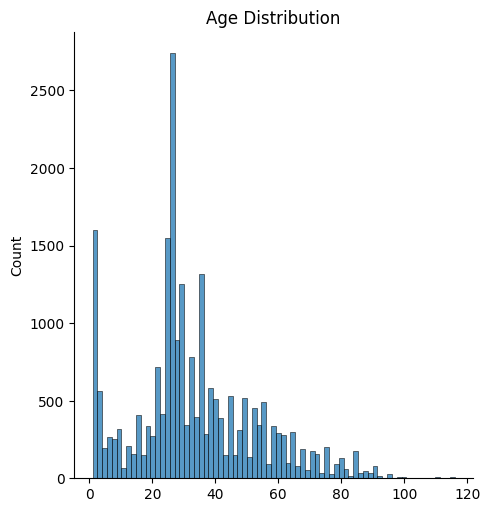

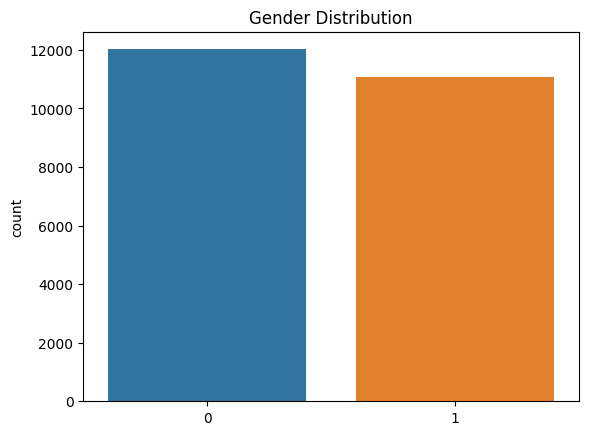

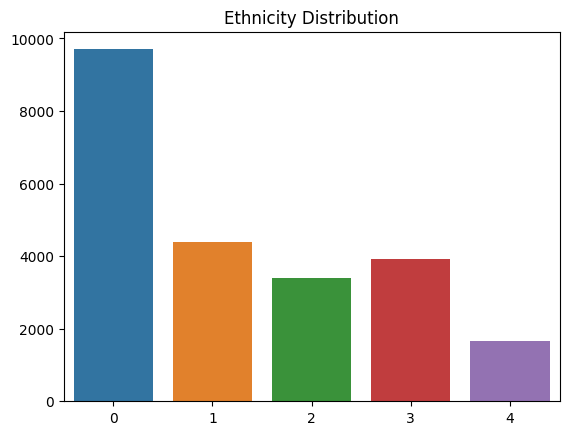

In [4]:
sns.displot(x=age_labels)
plt.title('Age Distribution')
plt.show()

sns.countplot(x=gender_labels)
plt.title('Gender Distribution')
plt.show()

sns.barplot(x=np.unique(ethnicity_labels), y=np.bincount(ethnicity_labels))
plt.title('Ethnicity Distribution')
plt.show()

After these brief observations, we can conclude that:
- the ages distribution is highly skewed to the left, with many ages close to 0 and many ages close to 30
- we have a fair distribution of data over the gender
- we note a majority of data is from White ethnicity.

Due to the high prevalence of data around the 0 age mark, I will proceed by filtering them out to avoid the model fitting too much to this data. 

In [9]:
import pandas as pd

images_data = pd.DataFrame({
    'image': image_paths, 
    'age': age_labels, 
    'gender': gender_labels, 
    'ethnicity': ethnicity_labels
})

age_less_than_4 = images_data[images_data['age'] < 4]
age_less_than_4_sampled = age_less_than_4.sample(frac=0.3, random_state=42)
age_4_or_more = images_data[images_data['age'] >= 4]
images_data = pd.concat([age_less_than_4_sampled, age_4_or_more])
images_data.reset_index(drop=True, inplace=True)

images_data

,image,age,gender,ethnicity
0,/kaggle/input/utkface-new/UTKFace/1_1_2_201701...,1,1,2
1,/kaggle/input/utkface-new/UTKFace/1_0_2_201612...,1,0,2
2,/kaggle/input/utkface-new/UTKFace/2_1_3_201612...,2,1,3
3,/kaggle/input/utkface-new/UTKFace/1_0_0_201701...,1,0,0
4,/kaggle/input/utkface-new/UTKFace/1_1_0_201701...,1,1,0
...,...,...,...,...
21771,/kaggle/input/utkface-new/UTKFace/7_1_0_201701...,7,1,0
21772,/kaggle/input/utkface-new/UTKFace/47_0_1_20170...,47,0,1
21773,/kaggle/input/utkface-new/UTKFace/30_1_0_20170...,30,1,0
21774,/kaggle/input/utkface-new/UTKFace/26_1_2_20170...,26,1,2


In [10]:
print(images_data.info())
print(images_data['age'].describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21776 entries, 0 to 21775
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   image      21776 non-null  object
 1   age        21776 non-null  int64 
 2   gender     21776 non-null  int64 
 3   ethnicity  21776 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 680.6+ KB
None
count    21776.000000
mean        35.147318
std         18.892706
min          1.000000
25%         24.000000
50%         30.000000
75%         46.000000
max        116.000000
Name: age, dtype: float64


The mean age in our dataset is 35 years old, with a standard deviation of 19.

Great. Let's now visualize some of the images we are going to deal with. 

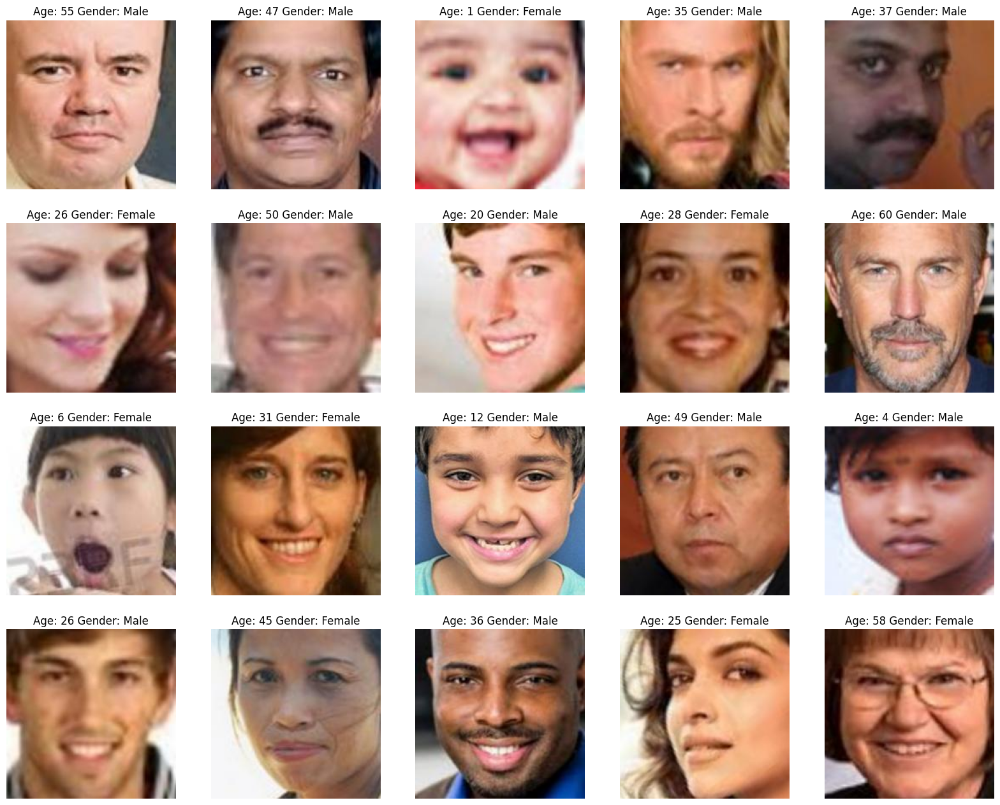

In [12]:
def plot_sample_images(image_paths, age_labels, gender_labels, gender_mapping, num_images=20):
    "Function to display sample images from UTKface dataset"
    plt.figure(figsize=(20, 20))
    
    for i in range(num_images):
        plt.subplot(5, 5, i + 1)
        img = cv2.imread(image_paths[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        age = age_labels[i]
        gender = gender_mapping[gender_labels[i]]
        plt.axis('off')
        plt.title(f'Age: {age} Gender: {gender}')
        plt.imshow(img)

    plt.show()

gender_mapping = {1: 'Female', 0: 'Male'}
ethnicity_mapping = {0: 'White', 1: 'Black', 2: 'Asian', 3: 'Indian', 4: 'Others'}

plot_sample_images(image_paths, age_labels, gender_labels, gender_mapping, num_images=20)

In [13]:
def get_ethnicity_samples(images_data, ethnicity_id, num_samples=4):
    samples = images_data[images_data['ethnicity'] == ethnicity_id]
    sample_images = samples.head(num_samples)
    return sample_images

ethnicity_samples = {}
for ethnicity_id in range(len(ethnicity_mapping)):
    ethnicity_samples[ethnicity_id] = get_ethnicity_samples(images_data, ethnicity_id)

# Creating a model

Here, we want to go through the process of creating a model that will try to predict:

- Age
- Gender

We will use PyTorch to achieve this result, and we will use the [LIME](https://github.com/marcotcr/lime) library to generate the explanations.

In the code snippet below, we will split the data into training, validation, and testing sets, and create transformers to resize and normalize the images, then moving them to tensors.

In [ ]:
import os
import random
from tqdm import tqdm
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch
from torchvision import transforms
from transformers import ViTModel, ViTFeatureExtractor
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import time

In [ ]:
train_data, test_data = train_test_split(images_data, test_size=0.2, random_state=42)
train_data, val_data = train_test_split(train_data, test_size=0.2, random_state=42)

class UTKFaceDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 0]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        age = self.data.iloc[idx, 1]
        gender = self.data.iloc[idx, 2]

        if self.transform:
            image = self.transform(image)
        
        return image, age, gender

feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224-in21k')
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)
])

train_dataset = UTKFaceDataset(train_data, transform=transform)
val_dataset = UTKFaceDataset(val_data, transform=transform)
test_dataset = UTKFaceDataset(test_data, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

Now we can create our model. 

The model in this case uses a pre-trained ViT model from [Google](https://huggingface.co/google/vit-base-patch16-224-in21k). This ensures that the model will be able to process the images in the dataset from a starting point, which will make it easier to train.

In [ ]:
class AgeGenderViT(nn.Module):
    def __init__(self):
        super(AgeGenderViT, self).__init__()
        self.vit = ViTModel.from_pretrained('google/vit-base-patch16-224-in21k')
        self.fc1 = nn.Linear(self.vit.config.hidden_size, 512)
        self.age_fc2 = nn.Linear(512, 1)
        self.gender_fc2 = nn.Linear(512, 2)

    def forward(self, x):
        outputs = self.vit(pixel_values=x).last_hidden_state
        x = outputs[:, 0, :]
        x = F.relu(self.fc1(x))

        age_output = self.age_fc2(x)
        gender_output = self.gender_fc2(x)
        
        return age_output, gender_output

Let's create an early stopping class to prepare for overfitting.

In [ ]:
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.delta = delta
        self.best_loss = float('inf')
        self.epochs_since_improvement = 0
        self.stop_training = False

    def __call__(self, val_loss):
        if val_loss < self.best_loss - self.delta:
            self.best_loss = val_loss
            self.epochs_since_improvement = 0
        else:
            self.epochs_since_improvement += 1
            if self.epochs_since_improvement >= self.patience:
                self.stop_training = True

# Model Training

Now we are finally ready to train the model.

In [14]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = AgeGenderViT().to(device)
age_criterion = nn.MSELoss()
gender_criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

def train_model(model, age_criterion, gender_criterion, optimizer, train_loader, val_loader, num_epochs):
    model.train()
    early_stopping = EarlyStopping(patience=5, delta=0.001)
    
    for epoch in range(num_epochs):
        start_time = time.time()
        running_loss = 0.0
        
        for images, ages, genders in train_loader:
            images = images.to(device)
            ages = ages.to(device).float()
            genders = genders.to(device).long()

            optimizer.zero_grad()
            age_outputs, gender_outputs = model(images)

            age_loss = age_criterion(age_outputs.view(-1), ages)
            gender_loss = gender_criterion(gender_outputs, genders)
            loss = age_loss + gender_loss

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for val_images, val_ages, val_genders in val_loader:
                val_images = val_images.to(device)
                val_ages = val_ages.to(device).float()
                val_genders = val_genders.to(device).long()

                val_age_outputs, val_gender_outputs = model(val_images)

                val_age_loss = age_criterion(val_age_outputs.view(-1), val_ages)
                val_gender_loss = gender_criterion(val_gender_outputs, val_genders)
                val_loss += (val_age_loss + val_gender_loss).item() * val_images.size(0)

        val_loss /= len(val_loader.dataset)
        
        epoch_duration = time.time() - start_time

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Val Loss: {val_loss:.4f}, Time: {epoch_duration:.2f}s')
        
        if early_stopping(val_loss):
            print("Early stopping triggered")
            break
        
        model.train()

print("Training Age and Gender Prediction Model with optimal learning rate")
train_model(model, age_criterion, gender_criterion, optimizer, train_loader, val_loader, num_epochs=10)

2024-08-04 16:16:56.012249: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-04 16:16:56.012373: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-04 16:16:56.147218: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Training Age and Gender Prediction Model with optimal learning rate
Epoch 1/10, Loss: 472.4639, Val Loss: 88.8934, Time: 345.12s
Epoch 2/10, Loss: 64.2906, Val Loss: 69.9279, Time: 326.51s
Epoch 3/10, Loss: 38.7364, Val Loss: 56.4989, Time: 325.71s
Epoch 4/10, Loss: 24.4086, Val Loss: 55.1864, Time: 374.63s
Epoch 5/10, Loss: 16.9814, Val Loss: 49.2462, Time: 359.27s
Epoch 6/10, Loss: 11.6136, Val Loss: 52.0544, Time: 357.65s
Epoch 7/10, Loss: 8.2081, Val Loss: 48.7319, Time: 344.53s
Epoch 8/10, Loss: 6.4976, Val Loss: 47.4249, Time: 359.36s
Epoch 9/10, Loss: 5.5655, Val Loss: 48.2351, Time: 396.32s
Epoch 10/10, Loss: 5.1359, Val Loss: 46.9409, Time: 366.38s


Our results have come in, and look pretty solid. 

After 10 epochs, with an average time of ~340-350 seconds each (5.5 minutes), totalling around 1 hour for the whole training.

# Model Evaluation

Now let's look at evaluating the model performance on new and unseen data, as well as its interpretability.

We will check the model's performance on the test set with the loss function, and then look at:

- A graph cross-checking age predictions with real ages;
- A confusion matrix and classification report for the gender;
- ROC AUC curve for gender;
- LIME for interpretability.

In [15]:
def evaluate_model(model, age_criterion, gender_criterion, dataloader, plot_predictions=False):
    model.eval()
    running_loss = 0.0
    all_age_outputs = []
    all_gender_outputs = []
    all_age_labels = []
    all_gender_labels = []
    all_images = []
    with torch.no_grad():
        for images, ages, genders in dataloader:
            images = images.to(device)
            ages = ages.to(device).float()
            genders = genders.to(device).long()

            age_outputs, gender_outputs = model(images)

            age_loss = age_criterion(age_outputs.view(-1), ages)
            gender_loss = gender_criterion(gender_outputs, genders)
            loss = age_loss + gender_loss

            age_preds = age_outputs.view(-1).cpu().numpy()
            gender_preds = torch.argmax(gender_outputs, dim=1).cpu().numpy()
            age_labels = ages.cpu().numpy()
            gender_labels = genders.cpu().numpy()

            all_age_outputs.extend(age_preds)
            all_gender_outputs.extend(gender_preds)
            all_age_labels.extend(age_labels)
            all_gender_labels.extend(gender_labels)
            all_images.extend(images.cpu().numpy())

            running_loss += loss.item() * images.size(0)

    epoch_loss = running_loss / len(dataloader.dataset)
    print(f'Loss: {epoch_loss:.4f}')
    age_mae = np.mean(np.abs(np.array(all_age_outputs) - np.array(all_age_labels)))
    print(f'Age MAE: {age_mae:.4f}')
    gender_accuracy = np.sum(np.array(all_gender_outputs) == np.array(all_gender_labels)) / len(all_gender_labels)
    print(f'Gender Accuracy: {gender_accuracy:.4f}')

    if plot_predictions:
        plot_age_predictions(np.array(all_age_outputs), np.array(all_age_labels))
        plot_gender_predictions(np.array(all_gender_outputs), np.array(all_gender_labels))

    return np.array(all_age_outputs), np.array(all_gender_outputs), np.array(all_age_labels), np.array(all_gender_labels), np.array(all_images)

all_age_outputs, all_gender_outputs, all_age_labels, all_gender_labels, all_images = evaluate_model(model, age_criterion, gender_criterion, test_loader, plot_predictions=False)

Loss: 47.2305
Age MAE: 4.8756
Gender Accuracy: 0.9394


Our results are shown as follows, with a Mean Absolute Error of 4.8 we are not really close to the true age as we might want to be. The Gender accuracy instead is much higher at 93% which is quite good.

This means that the model is likely good at predicting the gender, but not at predicting the age.

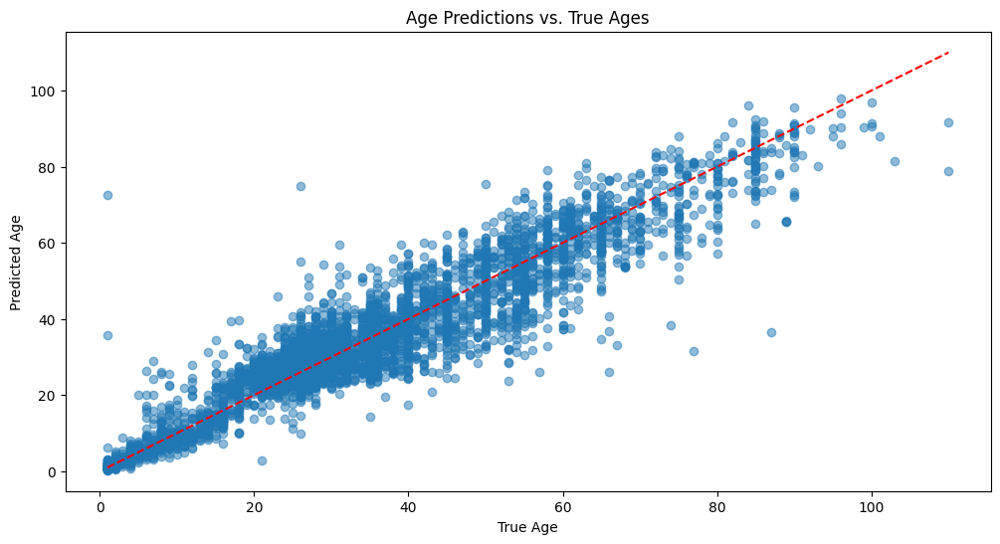

In [16]:
def plot_age_predictions(predictions, labels):
    plt.figure(figsize=(12, 6))
    plt.scatter(labels, predictions, alpha=0.5)
    plt.xlabel('True Age')
    plt.ylabel('Predicted Age')
    plt.title('Age Predictions vs. True Ages')
    plt.plot([min(labels), max(labels)], [min(labels), max(labels)], color='red', linestyle='--') 
    plt.show()

def plot_sample_images(images, age_preds, age_labels, gender_preds, gender_labels):
    num_samples = min(len(images), 5) 
    plt.figure(figsize=(15, 10))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        img = images[i].transpose(0, 2, 1) 
        plt.imshow(img)
        plt.title(f"Age: {age_labels[i]:.1f}\nPred: {age_preds[i]:.1f}\nGender: {gender_labels[i]}\nPred: {gender_preds[i]}")
        plt.axis('off')
    plt.show()

plot_age_predictions(all_age_outputs, all_age_labels)

The contrast between predicted and true ages show us a lot of overlap. We can see that the model is thus showing promising reuslts for predicting the age.

Confusion Matrix:
[[2093  121]
 [ 143 1999]]


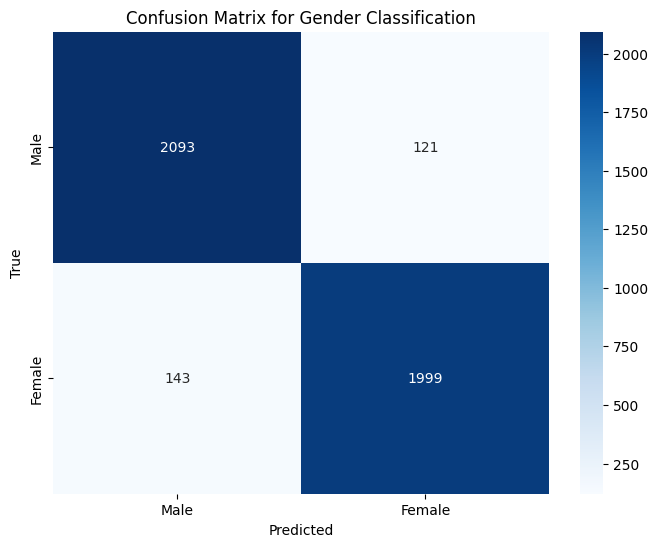

Classification Report:
              precision    recall  f1-score   support

        Male       0.94      0.95      0.94      2214
      Female       0.94      0.93      0.94      2142

    accuracy                           0.94      4356
   macro avg       0.94      0.94      0.94      4356
weighted avg       0.94      0.94      0.94      4356



In [17]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

def evaluate_gender_performance(predictions, labels):
    cm = confusion_matrix(labels, predictions)
    print("Confusion Matrix:")
    print(cm)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Male', 'Female'], yticklabels=['Male', 'Female'])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix for Gender Classification')
    plt.show()

    report = classification_report(labels, predictions, target_names=['Male', 'Female'])
    print("Classification Report:")
    print(report)

evaluate_gender_performance(all_gender_outputs, all_gender_labels)

**Accuracy:** The model achieved an overall accuracy of 94%, indicating strong performance in distinguishing between male and female categories.

**Precision and Recall:**

Male: Precision is high at 94%, meaning that when the model predicts "Male," it is correct 94% of the time. Recall is slightly higher at 95%, meaning the model identifies 95% of all actual males.
Female: Precision is also at 94%, and recall is slightly lower at 93%, showing the model is effective at identifying most actual females, though with slightly more false positives.

**F1-Score:** The F1-scores are balanced and at 94% for both categories, reflecting a good trade-off between precision and recall.

Overall, the model performs very well with a slight trade-off between precision and recall for male and female predictions.

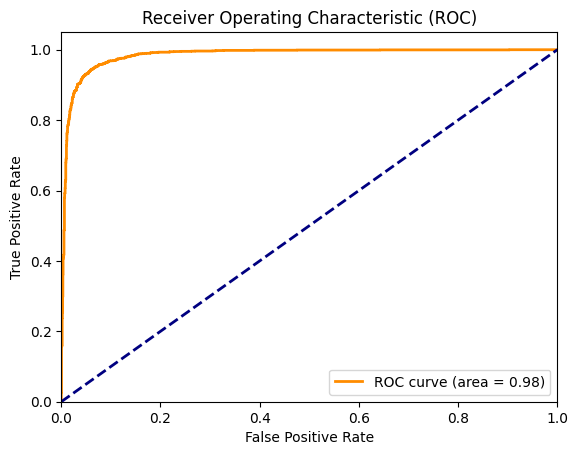

In [18]:
from sklearn.metrics import roc_curve, auc

def plot_roc_curve(labels, predictions):
    fpr, tpr, _ = roc_curve(labels, predictions)
    roc_auc = auc(fpr, tpr)
    
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')
    plt.show()

def get_gender_probabilities(model, dataloader):
    model.eval()
    all_gender_probs = []
    all_gender_labels = []
    
    with torch.no_grad():
        for images, _, genders in dataloader:
            images = images.to(device)
            genders = genders.to(device).long()
            
            _, gender_outputs = model(images)
            gender_probs = torch.softmax(gender_outputs, dim=1)[:, 1].cpu().numpy()
            all_gender_probs.extend(gender_probs)
            all_gender_labels.extend(genders.cpu().numpy())
    
    return np.array(all_gender_probs), np.array(all_gender_labels)

gender_probs, gender_labels = get_gender_probabilities(model, test_loader)
plot_roc_curve(gender_labels, gender_probs)

For the ROC AUC curve, we can see that the model is performing very well, with a 0.98 score. 

This means that the model is very effective at distinguishing between male and female categories.

# Model interpretability

Let's start by looking at some of the predictions that our model is doing. We will check bad and good predictions first.

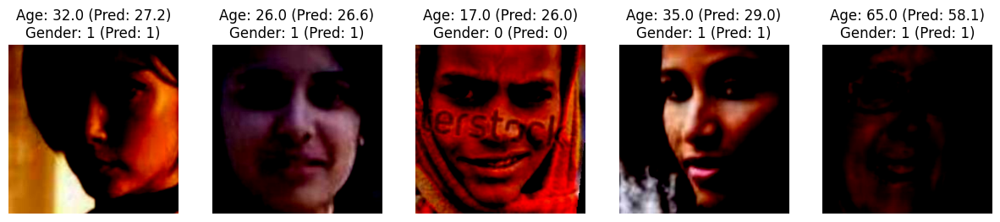

In [19]:
def plot_sample_images(images, age_preds, age_labels, gender_preds, gender_labels, num_samples=5):
    num_samples = min(len(images), num_samples) 
    plt.figure(figsize=(15, 10))
    
    for i in range(num_samples):
        plt.subplot(1, num_samples, i + 1)
        img = images[i].transpose(1, 2, 0)  
        plt.imshow(img)
        plt.title(f"Age: {age_labels[i]:.1f} (Pred: {age_preds[i]:.1f})\nGender: {gender_labels[i]} (Pred: {gender_preds[i]})")
        plt.axis('off')
    
    plt.show()

plot_sample_images(all_images, all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels)

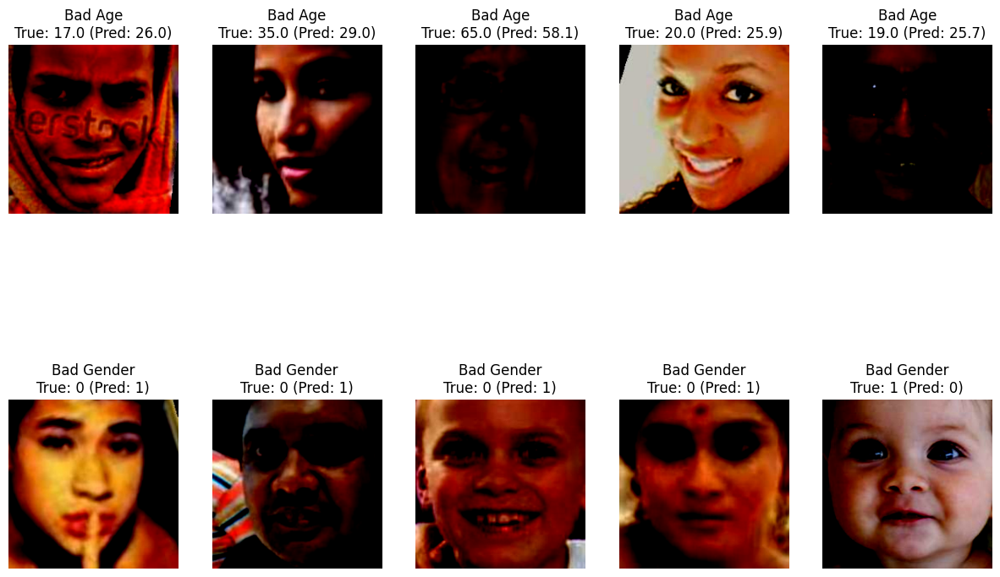

In [20]:
def find_bad_predictions(age_preds, age_labels, gender_preds, gender_labels, age_threshold=5.0):
    age_errors = np.abs(age_preds - age_labels)
    bad_age_indices = np.where(age_errors > age_threshold)[0]

    gender_errors = (gender_preds != gender_labels)
    bad_gender_indices = np.where(gender_errors)[0]

    return bad_age_indices, bad_gender_indices

def plot_bad_predictions(images, age_preds, age_labels, gender_preds, gender_labels, bad_age_indices, bad_gender_indices, num_samples=5):
    plt.figure(figsize=(15, 10))
    
    num_samples = min(len(bad_age_indices), num_samples)
    for i in range(num_samples):
        idx = bad_age_indices[i]
        plt.subplot(2, num_samples, i + 1)
        img = images[idx].transpose(1, 2, 0)
        plt.imshow(img)
        plt.title(f"Bad Age\nTrue: {age_labels[idx]:.1f} (Pred: {age_preds[idx]:.1f})")
        plt.axis('off')

    num_samples = min(len(bad_gender_indices), num_samples)
    for i in range(num_samples):
        idx = bad_gender_indices[i]
        plt.subplot(2, num_samples, num_samples + i + 1)
        img = images[idx].transpose(1, 2, 0)
        plt.imshow(img)
        plt.title(f"Bad Gender\nTrue: {gender_labels[idx]} (Pred: {gender_preds[idx]})")
        plt.axis('off')

    plt.show()

bad_age_indices, bad_gender_indices = find_bad_predictions(all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels)
plot_bad_predictions(all_images, all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels, bad_age_indices, bad_gender_indices)

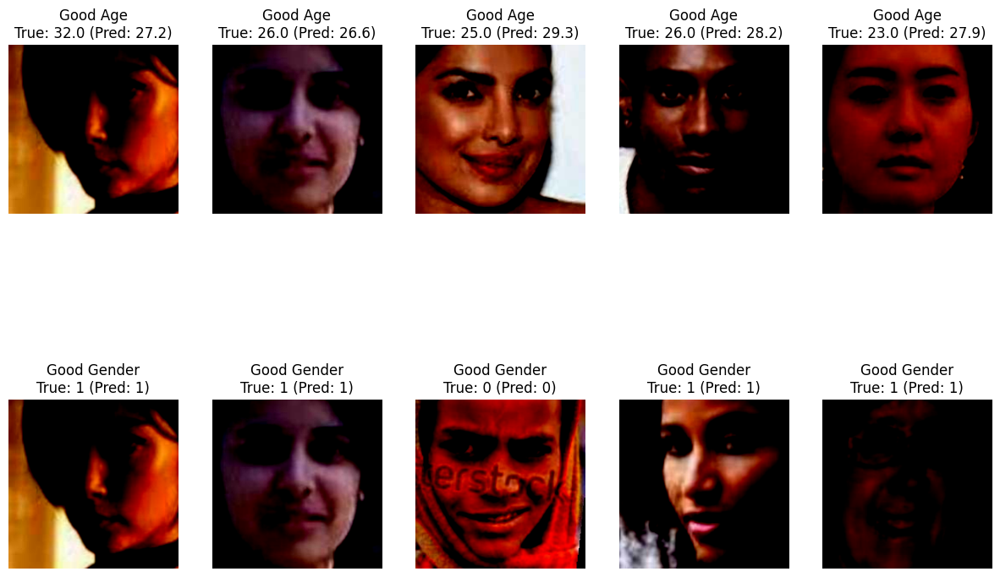

In [21]:
def find_good_predictions(age_preds, age_labels, gender_preds, gender_labels, age_threshold=5.0):
    age_errors = np.abs(age_preds - age_labels)
    good_age_indices = np.where(age_errors <= age_threshold)[0]

    gender_matches = (gender_preds == gender_labels)
    good_gender_indices = np.where(gender_matches)[0]

    return good_age_indices, good_gender_indices

def plot_good_predictions(images, age_preds, age_labels, gender_preds, gender_labels, good_age_indices, good_gender_indices, num_samples=5):
    plt.figure(figsize=(15, 10))
    
    num_samples = min(len(good_age_indices), num_samples)
    for i in range(num_samples):
        idx = good_age_indices[i]
        plt.subplot(2, num_samples, i + 1)
        img = images[idx].transpose(1, 2, 0) 
        plt.imshow(img)
        plt.title(f"Good Age\nTrue: {age_labels[idx]:.1f} (Pred: {age_preds[idx]:.1f})")
        plt.axis('off')

    num_samples = min(len(good_gender_indices), num_samples)
    for i in range(num_samples):
        idx = good_gender_indices[i]
        plt.subplot(2, num_samples, num_samples + i + 1)
        img = images[idx].transpose(1, 2, 0) 
        plt.imshow(img)
        plt.title(f"Good Gender\nTrue: {gender_labels[idx]} (Pred: {gender_preds[idx]})")
        plt.axis('off')

    plt.show()

good_age_indices, good_gender_indices = find_good_predictions(all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels)
plot_good_predictions(all_images, all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels, good_age_indices, good_gender_indices)

Now let's check the best and worst predictions that our model has made

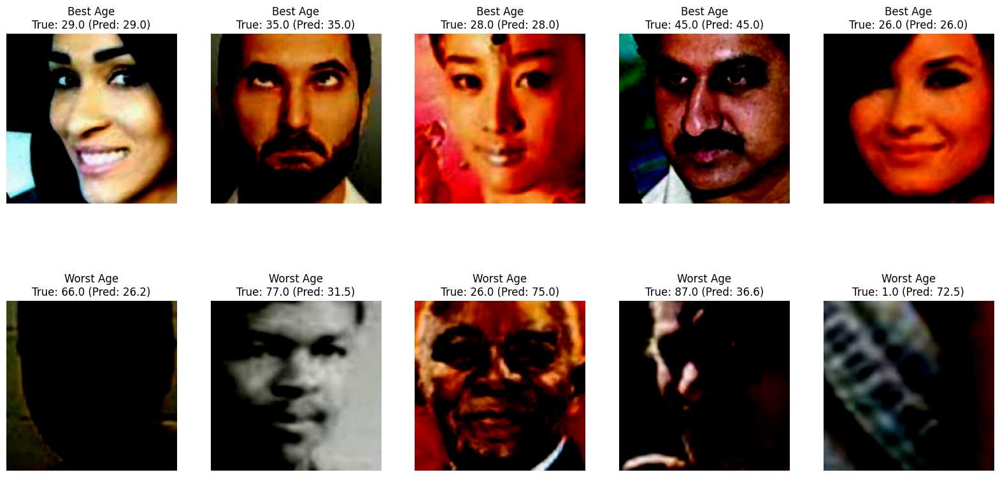

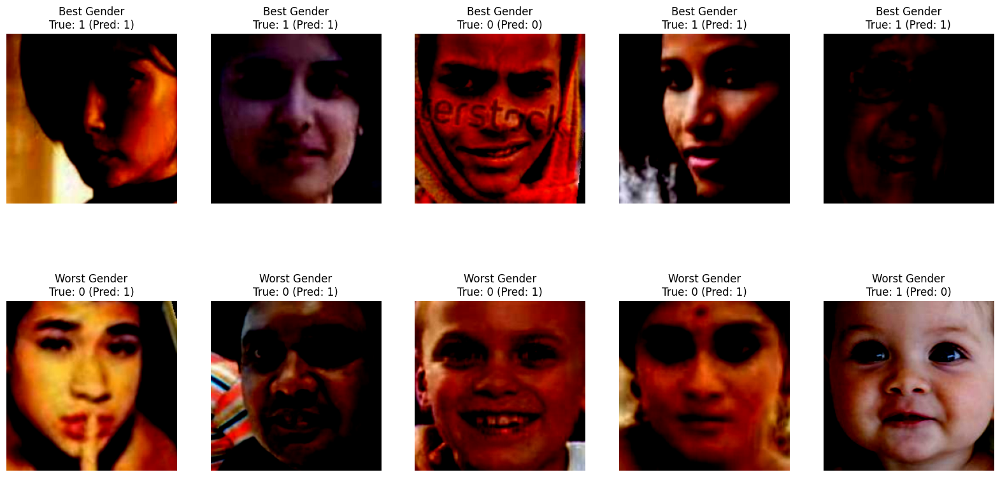

In [22]:
def find_best_worst_predictions(age_preds, age_labels, gender_preds, gender_labels, num_samples=5):
    age_errors = np.abs(age_preds - age_labels)

    best_age_indices = np.argsort(age_errors)[:num_samples]
    worst_age_indices = np.argsort(age_errors)[-num_samples:]

    gender_matches = (gender_preds == gender_labels)
    correct_gender_indices = np.where(gender_matches)[0]
    incorrect_gender_indices = np.where(~gender_matches)[0]

    best_gender_indices = correct_gender_indices[:num_samples]
    worst_gender_indices = incorrect_gender_indices[:num_samples]

    return best_age_indices, worst_age_indices, best_gender_indices, worst_gender_indices

def plot_best_worst_predictions(images, age_preds, age_labels, gender_preds, gender_labels, best_age_indices, worst_age_indices, best_gender_indices, worst_gender_indices):
    plt.figure(figsize=(20, 10))
    
    for i in range(len(best_age_indices)):
        idx = best_age_indices[i]
        plt.subplot(2, len(best_age_indices), i + 1)
        img = images[idx].transpose(1, 2, 0) 
        plt.imshow(img)
        plt.title(f"Best Age\nTrue: {age_labels[idx]:.1f} (Pred: {age_preds[idx]:.1f})")
        plt.axis('off')

    for i in range(len(worst_age_indices)):
        idx = worst_age_indices[i]
        plt.subplot(2, len(worst_age_indices), len(best_age_indices) + i + 1)
        img = images[idx].transpose(1, 2, 0) 
        plt.imshow(img)
        plt.title(f"Worst Age\nTrue: {age_labels[idx]:.1f} (Pred: {age_preds[idx]:.1f})")
        plt.axis('off')

    plt.figure(figsize=(20, 10))
    
    for i in range(len(best_gender_indices)):
        idx = best_gender_indices[i]
        plt.subplot(2, len(best_gender_indices), i + 1)
        img = images[idx].transpose(1, 2, 0)
        plt.imshow(img)
        plt.title(f"Best Gender\nTrue: {gender_labels[idx]} (Pred: {gender_preds[idx]})")
        plt.axis('off')

    for i in range(len(worst_gender_indices)):
        idx = worst_gender_indices[i]
        plt.subplot(2, len(worst_gender_indices), len(best_gender_indices) + i + 1)
        img = images[idx].transpose(1, 2, 0) 
        plt.imshow(img)
        plt.title(f"Worst Gender\nTrue: {gender_labels[idx]} (Pred: {gender_preds[idx]})")
        plt.axis('off')

    plt.show()

best_age_indices, worst_age_indices, best_gender_indices, worst_gender_indices = find_best_worst_predictions(all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels)
plot_best_worst_predictions(all_images, all_age_outputs, all_age_labels, all_gender_outputs, all_gender_labels, best_age_indices, worst_age_indices, best_gender_indices, worst_gender_indices)

Unfortunately, we can see that some images we are showing are not even images of real people. This can happen with such a large dataset, and even after manual cleaning. 

Besides that, some of the images we are showing have very good predictions from our model, and some others have poor predictions. Overall, the model is performing quite well.

In [23]:
def calculate_within_range_percentage(age_preds, age_labels, range_threshold=5):
    age_errors = np.abs(age_preds - age_labels)
    within_range = age_errors <= range_threshold
    percentage_within_range = np.mean(within_range) * 100
    return percentage_within_range, within_range 

Since we have MAE of 4.87, we could check just how many are the predictions that fit within this category. Let's check how many of our predicted ages fall within +/- 5 years of the actual age.

In [24]:
percentage_within_range, within_range = calculate_within_range_percentage(np.array(all_age_outputs), np.array(all_age_labels), range_threshold=5)

print(f"Percentage of predictions within ±5 years: {percentage_within_range:.2f}%")

Percentage of predictions within ±5 years: 62.88%


Our model is predicting around 63% of the people's age within 5 years of their actual age. For a starting point, this is a pretty good indication that our model is working well.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


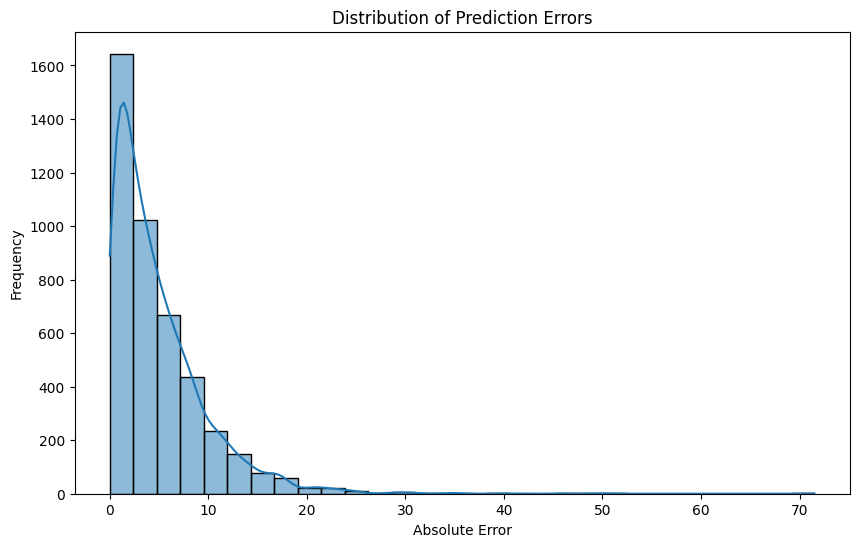

In [25]:
def plot_error_distribution(age_preds, age_labels):
    age_errors = np.abs(age_preds - age_labels)
    plt.figure(figsize=(10, 6))
    sns.histplot(age_errors, bins=30, kde=True)
    plt.xlabel('Absolute Error')
    plt.ylabel('Frequency')
    plt.title('Distribution of Prediction Errors')
    plt.show()
    
plot_error_distribution(all_age_outputs, all_age_labels)

We can see the errors are very much concentrated in the first +/- 10 years, with the tendency going down very fast after the 10 marks. Only very few errors are within > 20 years. 

Let's now check the MAE for each age range, split by 10 year intervals.

In [26]:
def evaluate_by_age_range(age_preds, age_labels, bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]):
    age_bins = np.digitize(age_labels, bins, right=True)
    for bin in np.unique(age_bins):
        bin_indices = np.where(age_bins == bin)[0]
        if bin_indices.size > 0:
            bin_preds = age_preds[bin_indices]
            bin_labels = age_labels[bin_indices]
            mae = np.mean(np.abs(bin_preds - bin_labels))
            if bin < len(bins) - 1:
                print(f"Age Range {bins[bin-1]}-{bins[bin]}: MAE = {mae:.2f}")
            else:
                print(f"Age Range {bins[bin-1]}+: MAE = {mae:.2f}")
        
evaluate_by_age_range(all_age_outputs, all_age_labels)

Age Range 0-10: MAE = 2.46
Age Range 10-20: MAE = 4.41
Age Range 20-30: MAE = 3.56
Age Range 30-40: MAE = 5.12
Age Range 40-50: MAE = 6.78
Age Range 50-60: MAE = 7.45
Age Range 60-70: MAE = 6.40
Age Range 70-80: MAE = 7.84
Age Range 80-90: MAE = 6.58
Age Range 90+: MAE = 6.51
Age Range 100+: MAE = 21.00


The results of the Mean Absolute Error for each age range are quite varied. There is indeed a big difference between the MAE for the high age ranges (100+, where it averages 21.5) and those for younger ones, where it even goes down to 2.46 for the age range 0 to 10.

This is an interesting result, as it shows that our model is able to predict the age of people with fewer errors when the person in question is within a certain age range.

In [27]:
def check_fairness(age_preds, age_labels, gender_labels):
    from sklearn.metrics import mean_absolute_error
    male_indices = np.where(gender_labels == 0)[0]
    female_indices = np.where(gender_labels == 1)[0]
    
    mae_male = mean_absolute_error(age_preds[male_indices], age_labels[male_indices])
    mae_female = mean_absolute_error(age_preds[female_indices], age_labels[female_indices])
    
    print(f"MAE for Males: {mae_male:.2f}")
    print(f"MAE for Females: {mae_female:.2f}")

check_fairness(all_age_outputs, all_age_labels, all_gender_labels)

MAE for Males: 5.14
MAE for Females: 4.60


The Mean Absolute Error for Males is 5.14, and the Mean Absolute Error for Females is 4.60. This means that the model is more accurate in predicting the age of females than males, even if by a quite narrow margin.

Now let's do an economical thought experiment. 

Suppose we're a company that uses the age prediction model to customize products or services based on age. Errors in predictions could lead to financial setbacks, such as:

- Incorrect Customization Costs: If our model predicts the age incorrectly, customers might receive products or services that do not match their preferences, leading to returns or dissatisfaction. This could cost the company an average of $10 per incorrect prediction due to returns, restocking fees, or loss of customer trust.

- Operational Costs: Handling incorrect predictions might involve additional customer service resources, leading to increased operational costs.

Let's see how, in economical terms, this would affect us.

In [28]:
def cost_benefit_analysis(age_preds, age_labels, cost_per_error=10):
    "Define cost-benefit analysis"
    errors = np.abs(age_preds - age_labels)
    total_cost = np.sum(errors) * cost_per_error
    average_cost_per_prediction = total_cost / len(age_preds)
    print(f"Total Cost of Errors: ${total_cost:.2f}")
    print(f"Average Cost per Prediction: ${average_cost_per_prediction:.2f}")

cost_benefit_analysis(all_age_outputs, all_age_labels)

Total Cost of Errors: $212379.84
Average Cost per Prediction: $48.76


In our super simple hypothetical scenario, we can see that getting wrong predictions is quite expensive. Because the total price would be 48.76 (the average price per wrong prediction), summing up to the number of all the wrong predictions. 

This all sums up, for our dataset, to a total of $212379.84 lost due to incorrect predictions.

That is indeed something that should be taken into consideration when thinking about whether to use an age prediction model or not.

# Checking model interpretability with LIME

We now want to understand better how the model is working under the hood. To do this, we can use SHAP and LIME to explain the model's predictions.

  0%|          | 0/1000 [00:00<?, ?it/s]

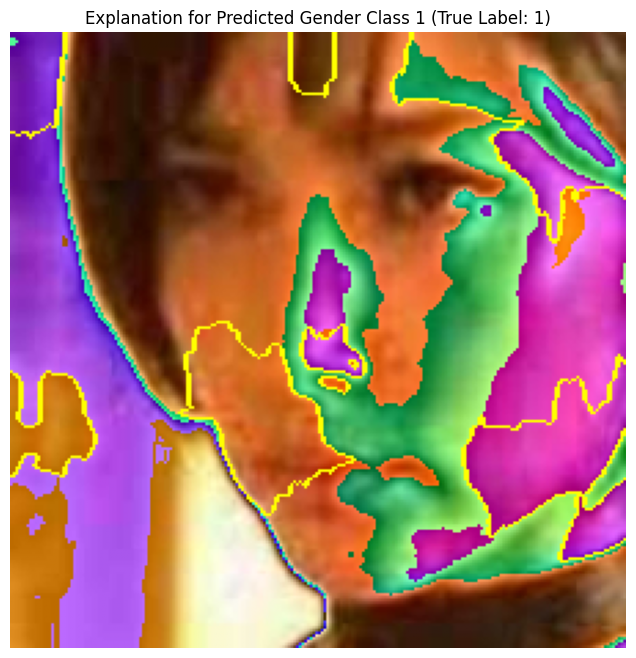

In [30]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

def batch_predict(images):
    model.eval()
    images = torch.stack([transform(image).to(device) for image in images], dim=0)
    with torch.no_grad():
        age_outputs, gender_outputs = model(images)
    return gender_outputs.cpu().numpy()

explainer = lime_image.LimeImageExplainer()


idx = 0 
image = all_images[idx].transpose(1, 2, 0)
true_gender_label = all_gender_labels[idx]
predicted_gender_label = all_gender_outputs[idx]

if image.dtype != np.uint8:
    image = (image * 255).astype(np.uint8)

explanation = explainer.explain_instance(image, batch_predict, top_labels=2, hide_color=0, num_samples=1000)

temp, mask = explanation.get_image_and_mask(predicted_gender_label, positive_only=True, num_features=10, hide_rest=False)
img_boundry1 = mark_boundaries(temp, mask)

plt.figure(figsize=(8, 8))
plt.title(f'Explanation for Predicted Gender Class {predicted_gender_label} (True Label: {true_gender_label})')
plt.imshow(img_boundry1)
plt.axis('off')
plt.show()

Ethnicity: White, Gender: Female


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

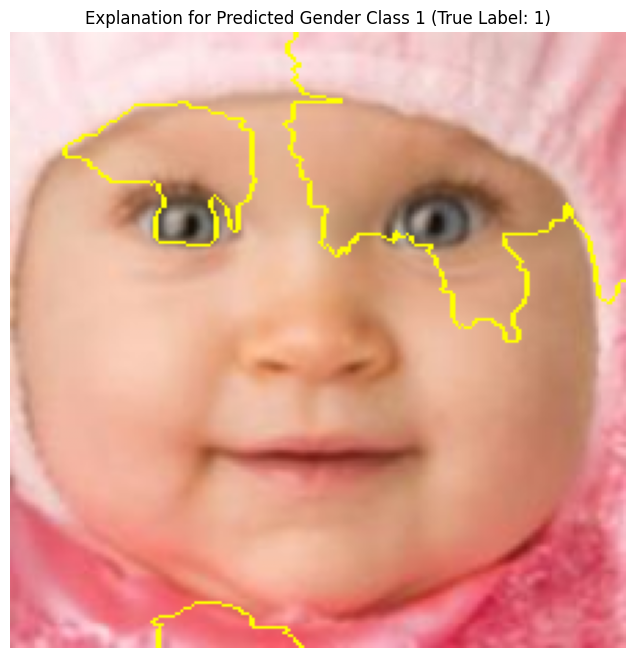

Ethnicity: White, Gender: Male


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

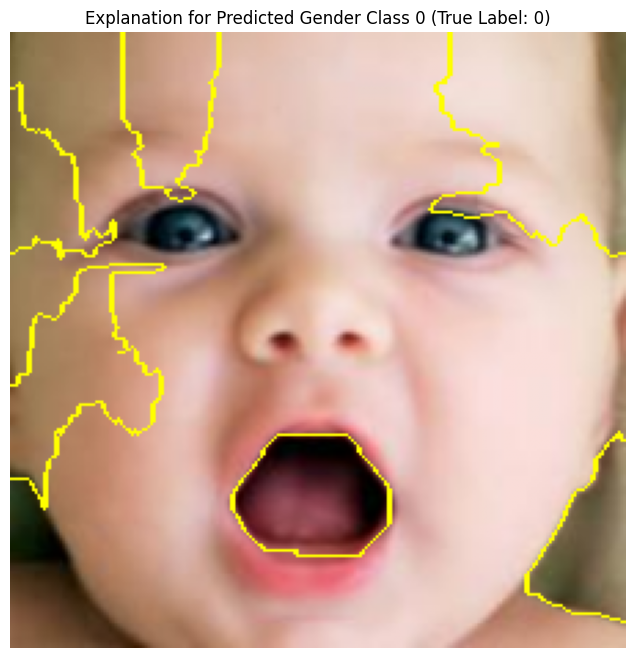

Ethnicity: Black, Gender: Female


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

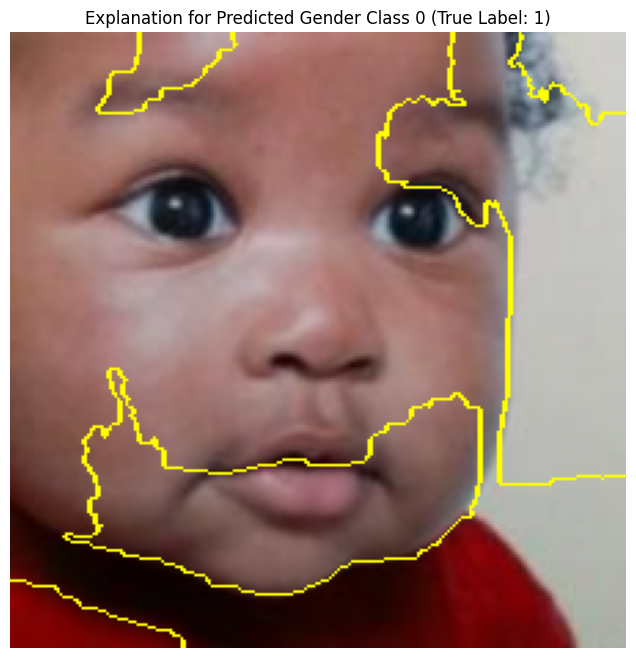

Ethnicity: Black, Gender: Male


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

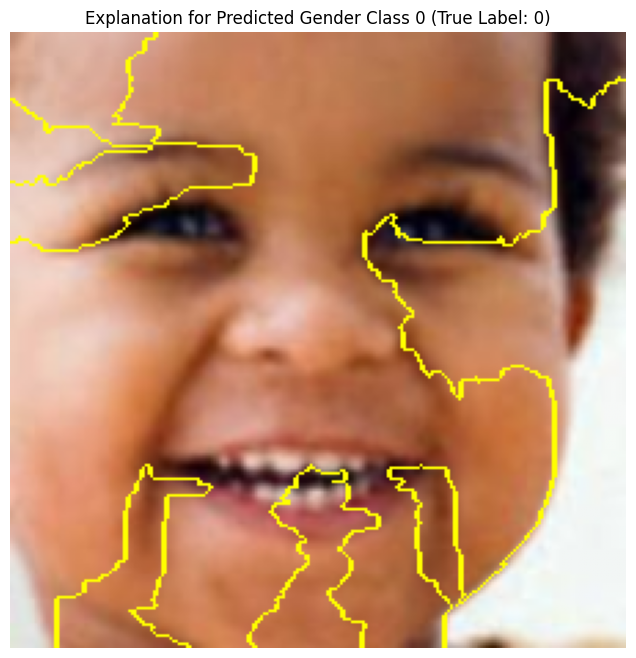

Ethnicity: Asian, Gender: Female


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

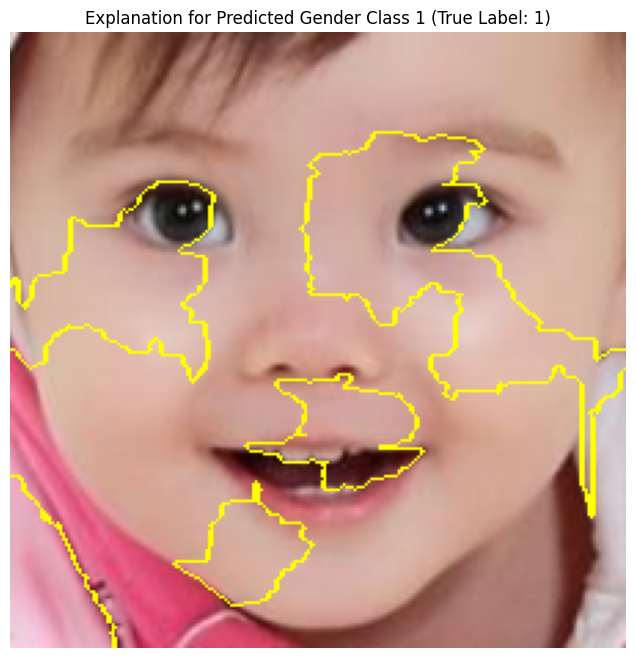

Ethnicity: Asian, Gender: Male


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

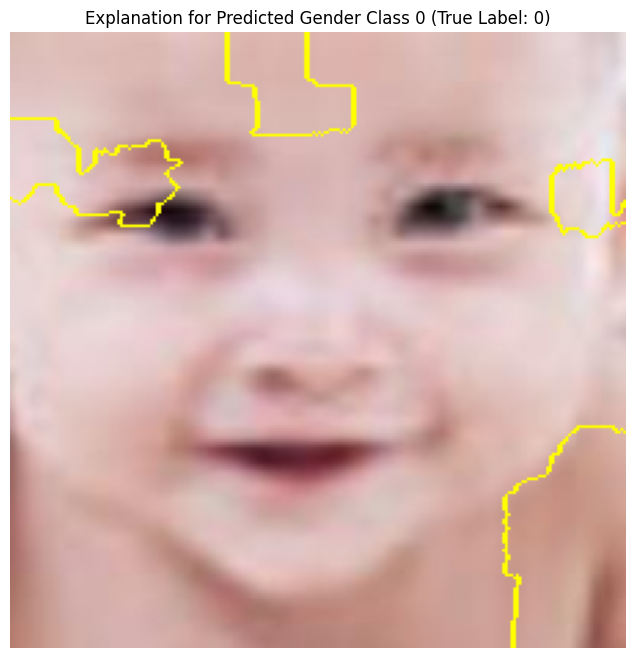

Ethnicity: Indian, Gender: Female


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

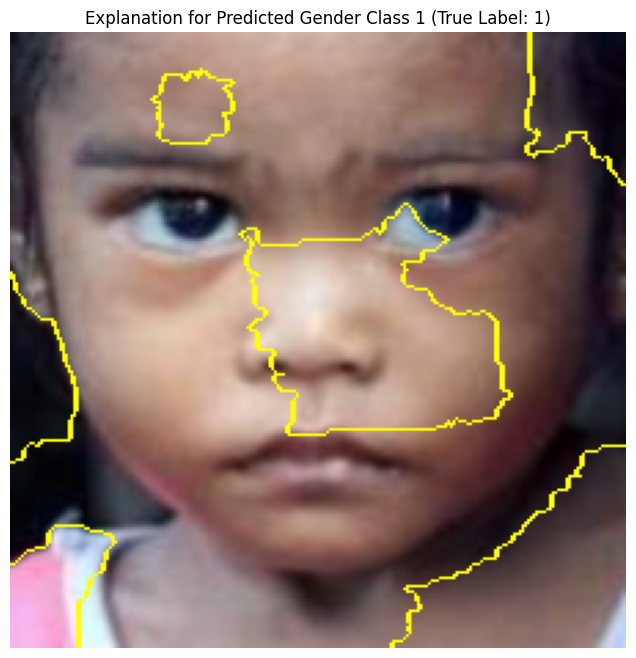

Ethnicity: Indian, Gender: Male


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

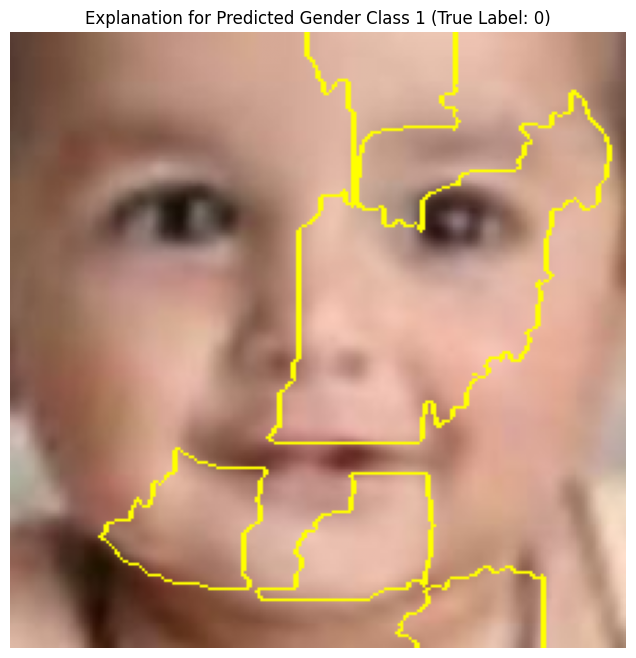

Ethnicity: Others, Gender: Female


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

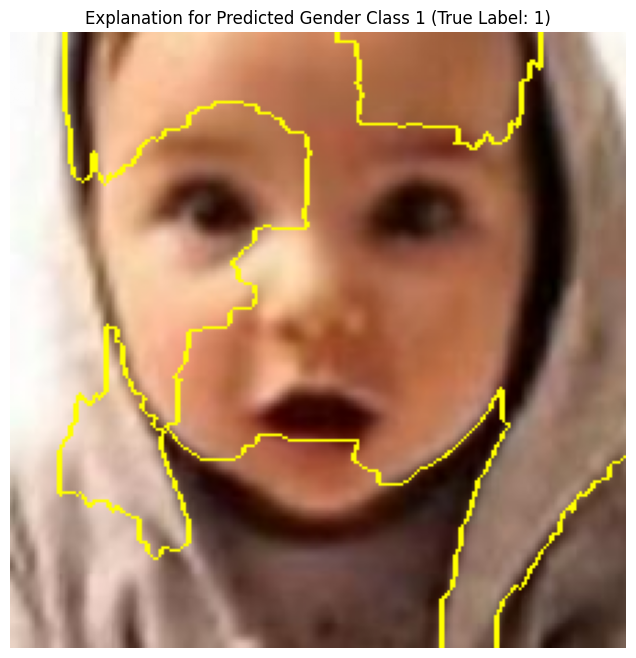

Ethnicity: Others, Gender: Male


/tmp/ipykernel_34/3464568566.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  img_path = row[0]
/tmp/ipykernel_34/3464568566.py:38: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  true_gender_label = row[2]


  0%|          | 0/1000 [00:00<?, ?it/s]

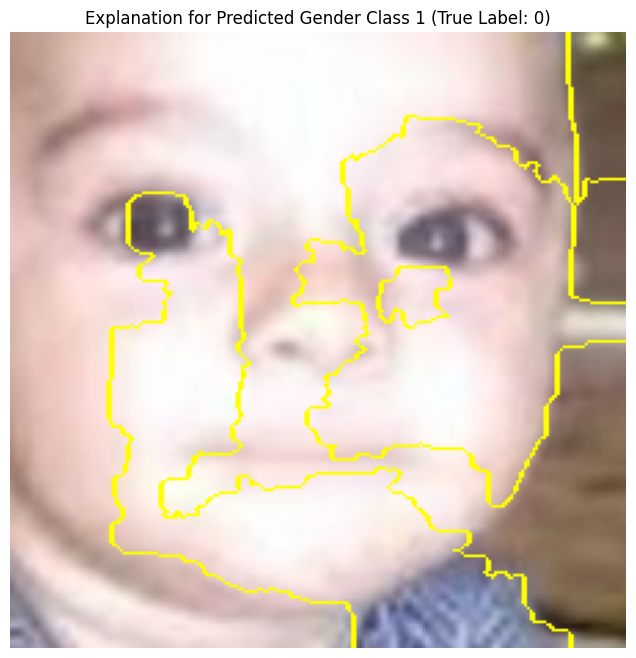

In [32]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
import cv2

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

def batch_predict(images):
    model.eval()
    images = torch.stack([transform(image).to(device) for image in images], dim=0)
    with torch.no_grad():
        age_outputs, gender_outputs = model(images)
    return gender_outputs.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

def get_gender_ethnicity_samples(images_data, ethnicity_id, gender_id, num_samples=1):
    samples = images_data[(images_data['ethnicity'] == ethnicity_id) & (images_data['gender'] == gender_id)]
    sample_images = samples.head(num_samples)
    return sample_images

ethnicity_gender_samples = {
    (ethnicity_id, gender_id): get_gender_ethnicity_samples(images_data, ethnicity_id, gender_id)
    for ethnicity_id in ethnicity_mapping.keys()
    for gender_id in gender_mapping.keys()
}

for (ethnicity_id, gender_id), samples in ethnicity_gender_samples.items():
    if not samples.empty:
        print(f"Ethnicity: {ethnicity_mapping[ethnicity_id]}, Gender: {gender_mapping[gender_id]}")
        for idx, row in samples.iterrows():
            img_path = row[0]
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            true_gender_label = row[2] 
            image_transformed = transform(image).numpy().transpose(1, 2, 0)  
            
            if image_transformed.dtype != np.uint8:
                image_transformed = (image_transformed * 255).astype(np.uint8)

            image_tensor = transform(image).unsqueeze(0).to(device)
            with torch.no_grad():
                _, gender_outputs = model(image_tensor)
            predicted_gender_label = torch.argmax(gender_outputs, dim=1).item()

            explanation = explainer.explain_instance(image_transformed, batch_predict, top_labels=2, hide_color=0, num_samples=1000)

            temp, mask = explanation.get_image_and_mask(predicted_gender_label, positive_only=True, num_features=10, hide_rest=False)
            img_boundry = mark_boundaries(temp, mask)

            plt.figure(figsize=(8, 8))
            plt.title(f'Explanation for Predicted Gender Class {predicted_gender_label} (True Label: {true_gender_label})')
            plt.imshow(img_boundry)
            plt.axis('off')
            plt.show()

To analyze the ethical issues and biases in our age and gender prediction model using the UTKFace dataset, we'll break down the key points and provide insights into potential concerns and solutions.

### Potential Biases and Ethical Issues

#### 0. Dataset Overview
**Observation:** The dataset is a large-scale faces dataset consisting of over 20,000 images. The images cover a wide range of ages and races and include both males and females.

It is important to outline that we are not quite sure whether the dataset has been gathered in compliance with privacy and confidentiality laws, as many of the faces here are of kids who might not be able to understand the implications, or also of dead people which makes a point to the usability of the dataset.

#### 1. Data Distribution and Representation Bias
**Observation:** The dataset shows an imbalance in ethnicity distribution, with a majority of the data being from White ethnicity.

**Impact:**
- The model may perform better on majority classes (e.g., White ethnicity) and poorly on underrepresented groups (e.g., Black, Asian, Indian, Others).
- This can lead to unfair and inaccurate predictions for individuals from underrepresented groups, exacerbating existing social biases.

**Solution:**
- Use techniques such as oversampling minority classes or data augmentation to balance the dataset.

#### 2. Age Distribution
**Observation:** The age distribution is skewed, with a high prevalence of data around the 0 to 5 age mark and many ages close to 30.

**Impact:**
- The model may struggle with predicting ages that are less represented in the training data.
- This could result in higher prediction errors for certain age groups, particularly those that are underrepresented, as was shown in the MAE analysis..

**Solution:**
- Apply data normalization techniques or stratified sampling to ensure a more uniform age distribution in the training data.

#### 3. Gender Bias
**Observation:** The gender distribution appears fair, but the model's performance metrics indicate a trade-off between precision and recall for male and female predictions.

**Impact:**
- A slight imbalance in precision and recall indicates that the model might be more accurate for one gender over the other.
- This can lead to unequal treatment based on gender, which is ethically problematic.

**Solution:**
- Implement gender-specific performance monitoring and apply fairness constraints during training to ensure balanced performance across genders.
- Regularly audit the model's performance and adjust training practices to mitigate any emerging biases.

### Analyzing Misclassified Samples

**Observation:** Patterns in misclassified samples can reveal potential ethical concerns and biases in the model.

**Impact:**
- Misclassifications could disproportionately affect certain demographic groups, leading to unfair treatment or misrepresentation.
- Analyzing these patterns helps identify if the model's errors are systemic and biased against particular groups.

**Solution:**
- Perform detailed error analysis to understand the root causes of misclassifications.
- Re-train the model with balanced and diverse data to reduce misclassification rates.

### Model Interpretability

**Observation:** Using LIME for model interpretability helps understand the decision-making process of the model.

**Impact:**
- Interpretability allows for identifying and addressing biased decision-making.
- It provides transparency, which is crucial for ethical AI deployment.

**Solution:**
- Regularly use interpretability tools like LIME to audit the model.
- Ensure that stakeholders understand how the model makes decisions and involve them in the bias mitigation process.

### Deployment Considerations

**Domain Suitability:**
Based on the results from the model that we just saw,

- **Suitable Domains:** Applications where age and gender predictions are used for non-critical purposes, such as demographic analysis in marketing.
- **Unsuitable Domains:** High-stakes applications like hiring, law enforcement, or medical diagnostics, where biases can lead to significant harm or discrimination.

**Recommendations:**
- Before deploying the model, conduct thorough ethical reviews and bias assessments.
- Establish clear guidelines and protocols for the responsible use of the model.
- Continuously monitor and update the model to address any emerging biases.

### Summary

- **Data Representation:** Ensure diverse and balanced data representation to mitigate biases.
- **Model Performance:** Regularly evaluate and audit model performance across different demographic groups.
- **Interpretability and Transparency:** Use interpretability tools to understand and address biased decision-making.
- **Ethical Deployment:** Carefully consider the ethical implications and suitability of deploying the model in various domains.

By following these guidelines, we can build a more fair, accurate, and ethically sound age and gender prediction model.

In [33]:
torch.save(model, 'age_gender_model')